In [119]:
# import 
import os
import re
import csv
import copy
import time
import math
from math import sqrt, acos, atan2, sin, cos
import datetime
import statistics
import neurokit2 as nk

from numpy import dot
from numpy.linalg import norm
import numpy as np
import pandas as pd
from pandas import ExcelWriter 
from glob import glob
from collections import defaultdict
import pingouin as pg
import scipy.stats as stats
import scipy
import pickle
import pymannkendall as mk
%matplotlib inline
import matplotlib.pyplot as plt 
import seaborn as sns
import missingno as msno
%load_ext line_profiler

from src.utils import (
    createDir, time2frame, metadata2frame, coughxlsx2df, processed2df, cut2case, cut2single, 
    _make_query, make_queries, query, query_w, getqueries, tval_df, bubbles2e, openpkl,
    createFolder, data2csv, save2pkl
)

from src.utils_plot import(
    cutplot, draw_corr_pval, drawheatmap_ttest,
)

import Dataloader as dl

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


ImportError: cannot import name 'createDir' from 'src.utils' (c:\Users\Jiyoon\python\SDphysiology\src\utils.py)

### Data Loader

In [2]:
date = 'pilot'
# datapath_top = f'./data/raw/{date}'
datapath_top = f'./{date}/Experiment'
scenes = ["Practice", "Elvtest", "Outside", "Hallway", "Elevator", "Hall"]

(names, anxiety, unity) = dl.dataloader(datapath_top, scenes)

daehyun


Stream 2: Calculated effective sampling rate 255.9334 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 255.9334 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 255.9317 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.8236 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 255.9317 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.8236 Hz is different from specified rate 50.0000 Hz.


eunseo


Stream 1: Calculated effective sampling rate 256.0042 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0042 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0052 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.8454 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0052 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.8454 Hz is different from specified rate 50.0000 Hz.


hyemin


Stream 2: Calculated effective sampling rate 256.0036 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0036 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.6444 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0013 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.6444 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0013 Hz is different from specified rate 100.0000 Hz.


jaehoon


Stream 2: Calculated effective sampling rate 256.0033 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0033 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0061 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.5371 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0061 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.5371 Hz is different from specified rate 50.0000 Hz.


jaehyung


Stream 1: Calculated effective sampling rate 256.0007 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0007 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0022 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.0594 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0022 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.0594 Hz is different from specified rate 50.0000 Hz.


juyeon


Stream 2: Calculated effective sampling rate 256.0018 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0018 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0042 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.5050 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0042 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.5050 Hz is different from specified rate 50.0000 Hz.


sangsu


Stream 1: Calculated effective sampling rate 256.0060 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0060 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0036 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.6224 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0036 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.6224 Hz is different from specified rate 50.0000 Hz.


shihwa


Stream 1: Calculated effective sampling rate 255.9319 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 255.9319 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 255.9290 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.7477 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 255.9290 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.7477 Hz is different from specified rate 50.0000 Hz.


soomin


Stream 2: Calculated effective sampling rate 256.0056 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0056 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0045 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.5574 Hz is different from specified rate 50.0000 Hz.
Stream 1: Calculated effective sampling rate 256.0045 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 88.5574 Hz is different from specified rate 50.0000 Hz.


yoojung


Stream 2: Calculated effective sampling rate 256.0041 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0041 Hz is different from specified rate 100.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0025 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.7097 Hz is different from specified rate 50.0000 Hz.
Stream 2: Calculated effective sampling rate 256.0025 Hz is different from specified rate 100.0000 Hz.
Stream 1: Calculated effective sampling rate 88.7097 Hz is different from specified rate 50.0000 Hz.


### Unified Dataframe for Unity data

### Anxiety Preprocessing

In [3]:
## Video Survey by Psychopy
## I add a line for cansu's data for further processing, between movie2 and movie3(zero slider recorded)
scenes = ["Outside", "Hallway", "Elevator", "Hall"]
anxiety_psy = dl.Anxiety_preprocessing(anxiety['Psychopy'],scenes)
directory = f'./data/processed/Anxiety_psy'
data2csv(anxiety_psy, names, filename='Anxiety_psychopy',directory=directory)


In [6]:
ppl = 1
anx_psy = anxiety_psy[ppl].copy()
anx_psy["Time"] -= anx_psy["Time"][0] ## Set Beginning of the playtime as zero.
df_S = anxiety['Survey'][ppl][0].dropna().reset_index(drop=True).copy()
df_S.loc[(df_S["Slider"] == -5), "Slider"] = math.nan
df_S = df_S.dropna().reset_index(drop=True)
df_S.loc[(df_S["Slider"]<0), "Slider"] = math.nan
df_S = df_S.fillna(method="bfill").dropna().reset_index(drop=True)
df_S["Slider"] = np.clip(df_S["Slider"],1,5)
df_S = df_S[['Internal ADC A13_CAL', 'GSR_CAL', "Slider"]].reset_index(drop=True)
S_df_g = nk.eda_process(df_S["GSR_CAL"], sampling_rate=100)[0].reset_index()
S_df_p = nk.ppg_process(df_S["Internal ADC A13_CAL"], sampling_rate=100)[0].reset_index()
lsl_S = df_S[["Slider"]].reset_index()
lsl_S = pd.merge(left = lsl_S, right = S_df_g, how="outer", sort= True)
lsl_S = pd.merge(left = lsl_S, right = S_df_p, how="outer", sort= True)


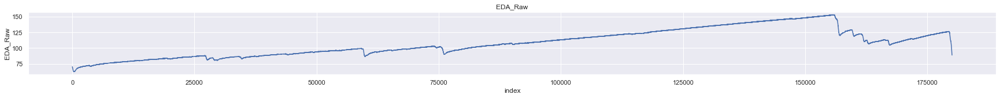

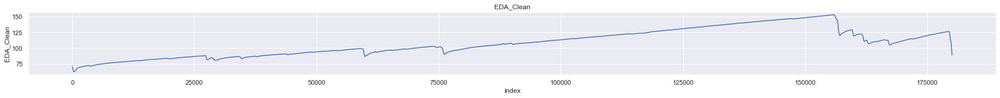

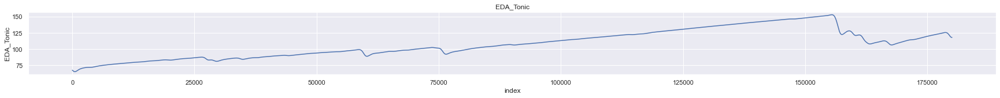

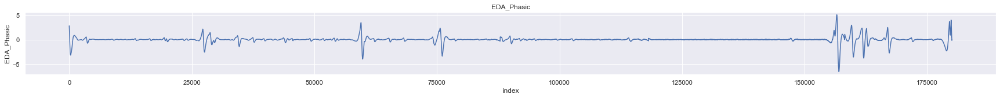

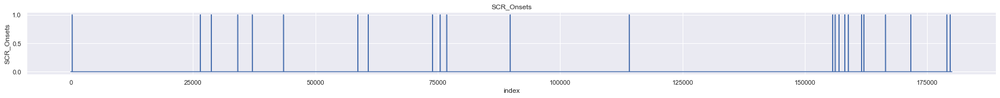

...

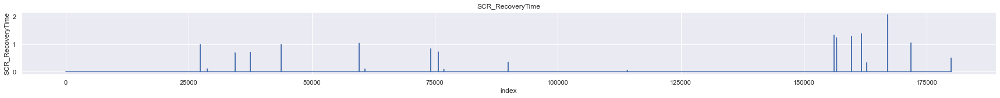

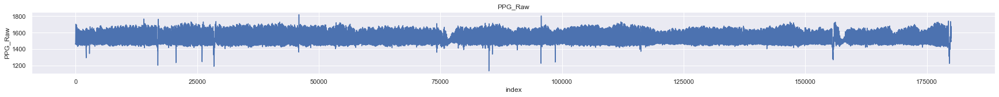

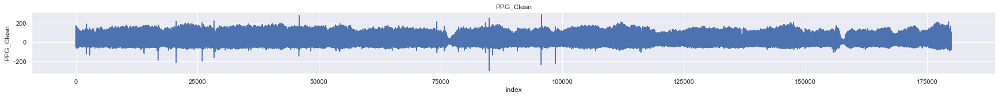

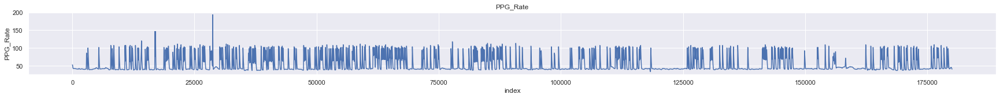

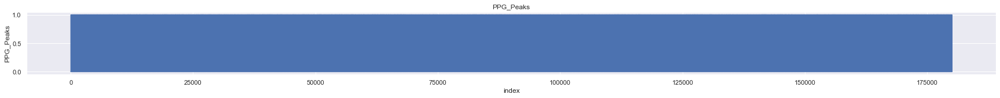

In [7]:
size = (30,2)

for items in S_df_g.columns:
    if items != 'index':
        plt.figure(figsize=size)
        plt.title(items)
        sns.lineplot(x= "index", y=items,data=S_df_g)
        plt.show()   
for items in S_df_p.columns:
    if items != 'index':
        plt.figure(figsize=size)
        plt.title(items)
        sns.lineplot(x= "index", y=items,data=S_df_p)
        plt.show()

### Transform

In [84]:

zone_c = 1.2 ## 만약 agent가 player의 personal zone 방향으로 이동하면 이를 intended로 한다. social과 public은 거리감이 있고 지나가는 것으로 인식될 수 있음
visual_degree = 55 ## htc vive pro의 시야각이 110도 이므로 한쪽 사이드당 55. 
intimate, personal, social, public = 0.45, 1.2, 3.6, 7.6
scenes = ["Outside", "Hallway", "Elevator", "Hall"]

data_list = ["Intimate", "Personal", "Social", "Public", "Total", "Intimate_IS", 
                  "Personal_IS", "Social_IS", "Public_IS", "Total_IS", "Intimate_IT", 
                  "Personal_IT", "Social_IT", "Public_IT", "Total_IT", "TowardAgent"] #This is data containing column name list. Too long, so use list.
### 코드 설명부 ###
### player: pos, rot, customevent(zone and risktake status), LSLVR/ agent: pos, rot, gender, zone + distance(with player)
### Outside를 실험 시작 기준으로 잡아 start_t를 전체 time column에서 빼서 Outside 시작을 0으로 만듦(agent, player, LSL모두)
### LSL_VR의 fps가 가장 높기 때문에 LSL_VR 기준으로 player를, 그렇게 정리된 df 기준으로 agent의 sync를 맞춤. --> LSLVR 기준으로 sync/Frame 변환 완료. Index=FPS
### agent와 anxiety_psy도 player 기준(LSL_VR과 sync 맞춘 후)으로 sync 맞추어서 붙임.
### agent의 distance, intention, insight(player기준), distance에 따른 personal space 침범(player 기준)을 0 or 1로 표기 후 전부 더한 값을 최종적으로 player에게 삽입.

###TODO####
# anxiety랑 LSL_psy는 movie start때를 기준으로 0 잡고 싹 밀어서 지들끼리 붙이고, fps 넣어서 그 다음에 unity/LSL_VR과 붙이기
## 위에서 anxiety_psy는 처리 완료. LSL_psy와 anxiety_psy timestamp 차이로 인해 추후 코드 수정 후 처리 요망.

players = []
for ppl in range(len(names)):
    whole_df = pd.DataFrame()
    ##### Anxiety ##########
    ### LSL VR #####
    df_VR = anxiety['VR'][ppl][0].dropna().reset_index(drop=True).copy()
    df_VR = df_VR[(df_VR["Scene"]>=3)&(df_VR["Scene"]<=6)]
    df_VR = df_VR[['Internal ADC A13_CAL', 'GSR_CAL', 'Scene', 'Unitytime']].reset_index(drop=True)
    VR_df_g = nk.eda_process(df_VR["GSR_CAL"], sampling_rate=100)[0].reset_index()
    VR_df_p = nk.ppg_process(df_VR["Internal ADC A13_CAL"], sampling_rate=100)[0].reset_index()
    lsl_VR = df_VR[["Scene", "Unitytime"]].reset_index()
    lsl_VR = pd.merge(left = lsl_VR, right = VR_df_g, how="outer", sort= True) 
    lsl_VR = pd.merge(left = lsl_VR, right = VR_df_p, how="outer", sort= True) 
    ### Anxiety Psychopy Video Survey Self-Report ###
    anx_psy = anxiety_psy[ppl].copy()
    anx_psy["Time"] -= anx_psy["Time"][0] ## Set Beginning of the playtime as zero.
    ### LSL Survey ######
######이 부분은 추후 Time stamp의 Sync를 맞추고 나서 anx_psy와 통합하도록 한다. 지금은 일단 보류. 
# 현재 이렇게 처리한 df의 첫 slider 값이 anx_psy의 첫 값과 일치하지 않는 이슈 있음. 따라서 sync 맞추려면 time stamp가 필요 할 듯
    df_S = anxiety['Survey'][ppl][0].dropna().reset_index(drop=True).copy()
    df_S.loc[(df_S["Slider"] == -5), "Slider"] = math.nan
    df_S = df_S.dropna().reset_index(drop=True)
    df_S.loc[(df_S["Slider"]<0), "Slider"] = math.nan
    df_S = df_S.fillna(method="bfill").dropna().reset_index(drop=True)
    df_S.loc[(df_S["Slider"]<1)] = 1
    df_S.loc[(df_S["Slider"]>5)] = 5
    df_S = df_S[['Internal ADC A13_CAL', 'GSR_CAL', "Slider"]].reset_index(drop=True)
    S_df_g = nk.eda_process(df_S["GSR_CAL"], sampling_rate=100)[0].reset_index()
    S_df_p = nk.ppg_process(df_S["Internal ADC A13_CAL"], sampling_rate=100)[0].reset_index()
    lsl_S = df_S[["Slider"]].reset_index()
    lsl_S = pd.merge(left = lsl_S, right = S_df_g, how="outer", sort= True) 
    lsl_S = pd.merge(left = lsl_S, right = S_df_p, how="outer", sort= True)
    
    


    for scene in scenes:
        transform_a = [] #Empty list for agent position
        
        df_p, df_r, df_c = unity['position'][scene][ppl], unity['rotation'][scene][ppl], unity['customevent'][scene][ppl]
        subjects =  unity['subjects'][scene][ppl]
        df_c["Time"] = pd.to_numeric(df_c["Time"])
        if scene == "Outside":
            df_t = df_c[(df_c["Action"] == " SceneStatus")&(df_c["Actor"] == ' "Player')].copy() 
            start_t = df_t[df_t["3"] == 'Start"']["Time"].values[0] 
        if scene == "Hall":
            df_t = df_c[(df_c["Action"] == " SceneStatus")&(df_c["Actor"] == ' "Player')].copy()
            end_t = df_t[df_t["3"] == 'end"']["Time"].values[0]
            
        playerid = subjects.loc[subjects[' Name']==" Player_VR", "ID"].values[0] ## PlayerVR object의 id
        headid = subjects.loc[subjects[' Name']==" HeadCollider", "ID"].values[0] ## PlayerVR의 child인 Head의 id. 실질적으로 player의 headset이므로 이것의 위치를 사용.
        
        ## Extract Zone info from custom df and add to playerdf
        df_z = df_c[(df_c["Action"] == " Zone")&(df_c["Actor"] == ' "Player')&(df_c["1"]!="0")][["Time","2", "3"]].copy()
        df_z = df_z.rename(columns={"2": "zone", "3":"risktake"})
        df_z.loc[(df_z["risktake"] == '-99"')|(df_z["risktake"] == '0"')|(df_z["risktake"] == '1"'),"risktake"] = 0
        df_z = df_z.astype("float32").reset_index(drop=True)
        
        lsldf = lsl_VR[(lsl_VR["Scene"]==scenes.index(scene)+3)&(lsl_VR["Unitytime"]>= start_t)].rename(columns={"Unitytime": "Time"})
        
        ## Create player transform dataframe, containing both position and rotation
        player_p = df_p[df_p['SubjectID']==headid].copy()
        player_r = df_r[df_r['SubjectID']==headid].copy().drop(columns=["SubjectID", "Subject"])
        playerdf = pd.merge(left = player_p, right =player_r, how="outer", on = "Time", suffixes=('_pos','_rot'), sort= True)
        playerdf = pd.merge(left = playerdf, right =df_z, how="outer", on = "Time", sort= True).reset_index(drop=True).fillna(method="ffill")
        playerdf[["zone", "risktake"]] = playerdf[["zone", "risktake"]].fillna(value=0)
        if scene == "Elevator":
        ################# 여기서 Elevator 층 처리 필요. Elevator part의 경우 y좌표가 다른 Agent가 생기기 때문에 잘못 처리하면 다른 층의 Agent를 근접하다고 할 수 있음.
            #### 따라서 이거 꼭 고려해서 추후 코드 작성 필요
            df_e = df_c[(df_c["Action"] == " CurrentFloor")&(df_c["Actor"] == ' "Player')].copy()
            df_e["1"] = df_e["1"].str.replace('"',"")
            df_e = df_e.rename(columns={"1": "floor"})
            df_e = df_e[["Time", "floor"]].astype("float32").reset_index(drop=True)
            playerdf = pd.merge(left = playerdf, right =df_e, how="outer", on = "Time", sort= True).reset_index(drop=True).fillna(method="ffill")
        
        columns = playerdf.columns.tolist()
        
        ### Merge with LSL VR data
        playerdf = pd.merge(left = playerdf, right =lsldf, how="outer", on = "Time", sort= True).reset_index(drop=True)
        playerdf[columns] = playerdf[columns].fillna(method="ffill")        
        playerdf = playerdf.dropna()
        playerdf["type"] = "player"
        playerdf["Scene"] = scene
        
        ## Personal Space Invasion by agent check. IS=InSight, IT= InTention. Intention only checked if the agent is in sight.
        playerdf[data_list] = 0
########/########Put gender of player here later(after processing survey)
        playerdf["Time"] = playerdf["Time"]-start_t ## Set start of Outside as the start of experiment.
        ## Time to Frame for further analysis and sync
        playerdf['FPS'] = playerdf['Time'].apply(time2frame, textformet=False, frame=50) 
        playerdf = playerdf.drop_duplicates(subset = ['FPS'] , keep='first').set_index('FPS')
        newindex = range(playerdf.index[0],playerdf.index[-1]+1)
        playerdf = playerdf.reindex(newindex).fillna(method = 'ffill')
        p_time = playerdf["Time"]
        
        ids = df_p['SubjectID'].unique().tolist() #subjectIDs
        ids.remove(playerid) # to prevent calculation with double player.
        ids.remove(headid) # to prevent calculation with double player. this is head colider id
        
        
        ####Add anxiety self report data, sync in.
        _psy = pd.merge(left = p_time, right =anx_psy[anx_psy["Scene"] == scene], how="outer", on = "Time", sort= True).fillna(method="ffill")
        _psy = pd.merge(left = p_time, right = _psy, how="left", on = "Time", sort= True) ## To set the data length same with player df
        _psy['FPS'] = _psy['Time'].apply(time2frame, textformet=False, frame=50)
        _psy = _psy.drop_duplicates(subset = ['FPS'] , keep='first').set_index('FPS')
        newindex = range(_psy.index[0],_psy.index[-1]+1)
        _psy = _psy.reindex(newindex).fillna(method = 'ffill')
        playerdf["Anxiety_psy"] = _psy["marker"]
        
        

        ##############AGENT LOOP###############
        for subid in ids:
            agent_p = df_p[df_p['SubjectID']==subid].copy()
            agent_r = df_r[df_r['SubjectID']==subid].copy().drop(columns=["SubjectID", "Subject"])
            agentdf = pd.merge(left = agent_p, right =agent_r, how="outer", on = "Time", suffixes=('_pos','_rot'), sort= True).reset_index(drop=True).fillna(method="ffill")
            gender = subjects[subjects["ID"]==subid][" Name"].values[0].split("_")[-2]
            zone = subjects[subjects["ID"]==subid][" Name"].values[0].split("_")[-3]
            agentdf["gender"], agentdf["zone"], agentdf["type"] = gender, zone, "agent"
            agentdf = agentdf.rename(columns={" Time": "Time"})
            agentdf["Time"] = agentdf["Time"]-start_t #Set start time as outside scene begins.
            ## sync with player dataframe. This must be performed after player dataframe sync with LSL_VR.
            _df = pd.merge(left = p_time, right =agentdf, how="outer", on = "Time", sort= True).fillna(method="ffill")
            agentdf = pd.merge(left = p_time, right = _df, how="left", on = "Time", sort= True) ## To set the data length same with player df
            ## Time to Frame for further analysis and sync
            agentdf['FPS'] = agentdf['Time'].apply(time2frame, textformet=False, frame=50) 
            agentdf = agentdf.drop_duplicates(subset = ['FPS'] , keep='first').set_index('FPS')
            newindex = range(agentdf.index[0],agentdf.index[-1]+1)
            agentdf = agentdf.reindex(newindex).fillna(method = 'ffill')
            
            #### Analysis for distance and intention ###########
            ## agent의 directional vector(frontvec)과 agent->player vector(ap) 사이의 각도와
            ## player의 personal space circle과 agent 위치상의 접점 벡터 중 하나와 agent->player vector(ap) 사이의 각도, 
            ## 즉 agent가 player의 personal space를 침범 할 수 있는 최소 방향각도를 비교하여
            ## 전자가 후자보다 작으면 agent가 그대로 전진할 시 player의 personal space에 들어오게 되므로 intention이 있다고 판단한다.
            px, pz, py = playerdf["X_pos"], playerdf["Z_pos"], playerdf["Y_rot"] ## Player Transforms
            ax, az, ay = agentdf["X_pos"], agentdf["Z_pos"], agentdf["Y_rot"]
            agentdf["Intention"], agentdf["Insight"] = 0, 0
            t1, _ = dl.gettangentpoint(px, pz, ax, az,zone_c)  #Tangent point analysis
            ap = dl.getvector(ax, az, px, pz).T #agent to player vector
            Tangent_vec = dl.getvector(ax, az, t1[0], t1[1]).T
            
            agentdf["ap_tv"] = dl.anglebetween(ap, Tangent_vec).tolist() # Tangent Degree. angle between agent->player vector and agent and player personal space circle tangent vector.
            agentdf["ap_fv"] = dl.anglebetween(ap, dl.getfrontvec(ay).T).tolist() # Agend Direction Vector degree. angle between agent->player vector and agent front vector
            
            ## Assign Intention as if agent directional vector is toward the player personal zone circle. 1 if intended.
            agentdf.loc[agentdf["ap_tv"]>=agentdf["ap_fv"], "Intention"] = 1 #Directed to player            
            ## Assign Distance value
            agentdf["Distance"] = dl.distance(px, pz, ax, az) #Get distance with player
            agentdf[data_list] = 0
            agentdf[["Intimate", "Personal", "Social", "Public", "Total", "Intimate_IS", 
                  "Personal_IS", "Social_IS", "Public_IS", "Total_IS", "Intimate_IT", 
                  "Personal_IT", "Social_IT", "Public_IT", "Total_IT"]] = 0
            ## Assign Personal Distance Check value
            agentdf.loc[agentdf["Distance"]<= intimate, "Intimate"] = 1 
            agentdf.loc[(agentdf["Distance"]<= personal)&(agentdf["Distance"]> intimate), "Personal"] = 1 
            agentdf.loc[(agentdf["Distance"]<= social)&(agentdf["Distance"]> personal), "Social"] = 1 
            agentdf.loc[(agentdf["Distance"]<= public)&(agentdf["Distance"]> social), "Public"] = 1 
            agentdf["Total"] = agentdf[["Intimate", "Personal", "Social", "Public"]].sum(axis=1)
            ### Agent In Sight(within public space)
            pf = dl.getfrontvec(py).T #Get front vector of the player
            pa = dl.getvector(px, pz, ax, az).T #player to agent vector
            pa_angle = np.abs(dl.anglebetween(pf, pa).tolist()) #Get angle between two vector above
            agentdf["pa_angle"] = pa_angle
            agentdf.loc[agentdf["pa_angle"]<= visual_degree, "Insight"] = 1
            ###
            agentdf.loc[(agentdf["Intimate"]== 1)&(agentdf["Insight"]== 1), "Intimate_IS"] = 1 
            agentdf.loc[(agentdf["Personal"]== 1)&(agentdf["Insight"]== 1), "Personal_IS"] = 1 
            agentdf.loc[(agentdf["Social"]== 1)&(agentdf["Insight"]== 1), "Social_IS"] = 1 
            agentdf.loc[(agentdf["Public"]== 1)&(agentdf["Insight"]== 1), "Public_IS"] = 1 
            agentdf["Total_IS"] = agentdf[["Intimate_IS", "Personal_IS", "Social_IS", "Public_IS"]].sum(axis=1)
            
            agentdf.loc[(agentdf["Intimate"]== 1)&(agentdf["Insight"]== 1)&(agentdf["Intention"]== 1), "Intimate_IT"] = 1 
            agentdf.loc[(agentdf["Personal"]== 1)&(agentdf["Insight"]== 1)&(agentdf["Intention"]== 1), "Personal_IT"] = 1 
            agentdf.loc[(agentdf["Social"]== 1)&(agentdf["Insight"]== 1)&(agentdf["Intention"]== 1), "Social_IT"] = 1 
            agentdf.loc[(agentdf["Public"]== 1)&(agentdf["Insight"]== 1)&(agentdf["Intention"]== 1), "Public_IT"] = 1 
            agentdf["Total_IT"] = agentdf[["Intimate_IT", "Personal_IT", "Social_IT", "Public_IT"]].sum(axis=1)
            if(zone == 'T'):
                agentdf.loc[(agentdf["Distance"]<= public)&(agentdf["Distance"]> social)&(agentdf["Insight"]== 1),"TowardAgent"] = 4
                agentdf.loc[(agentdf["Distance"]<= social)&(agentdf["Distance"]> personal)&(agentdf["Insight"]== 1),"TowardAgent"] = 3
                agentdf.loc[(agentdf["Distance"]<= personal)&(agentdf["Distance"]> intimate)&(agentdf["Insight"]== 1),"TowardAgent"] = 2
                agentdf.loc[(agentdf["Distance"]<= intimate)&(agentdf["Insight"]== 1),"TowardAgent"] = 1
                
                
            ## Add up all values from each agent
            playerdf[data_list] += agentdf[data_list]

            transform_a.append(agentdf)

        

        whole_df =  pd.concat([whole_df, playerdf], axis=0)
    whole_df["floor"] = whole_df["floor"].fillna(value= "None")
    players.append(whole_df)

daehyun


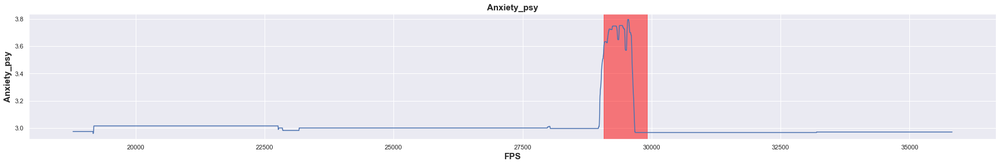

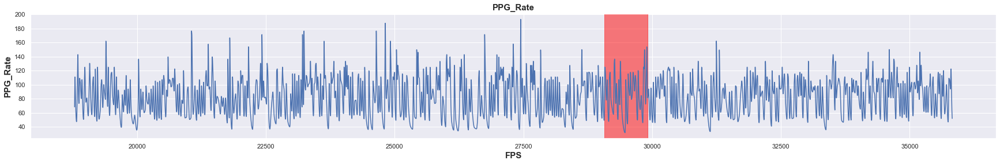

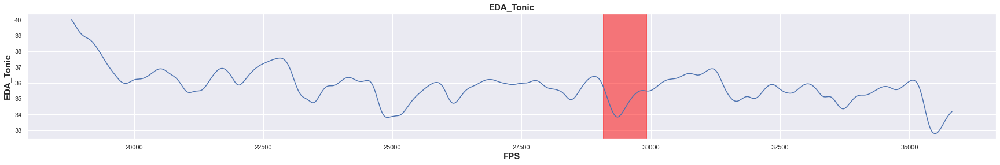

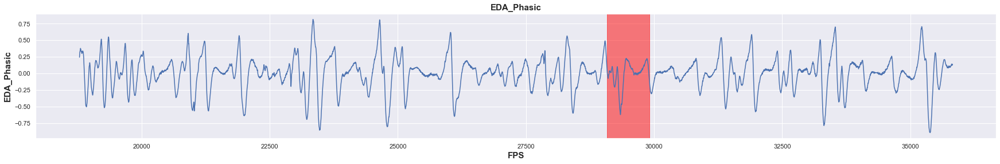

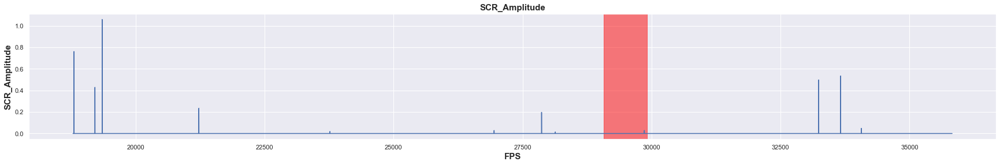

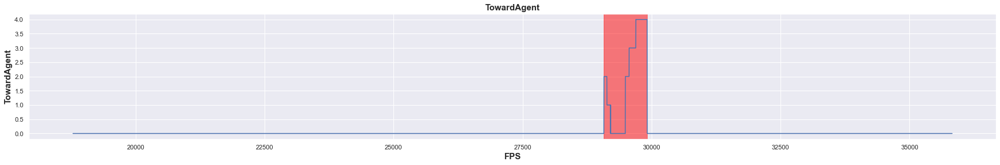

eunseo


<Figure size 432x288 with 0 Axes>

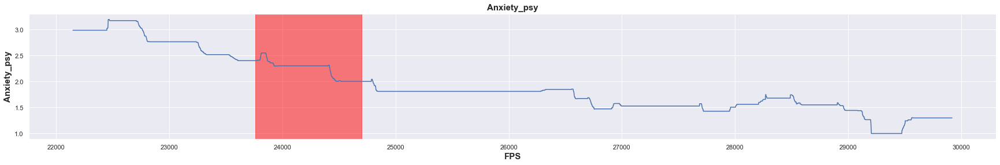

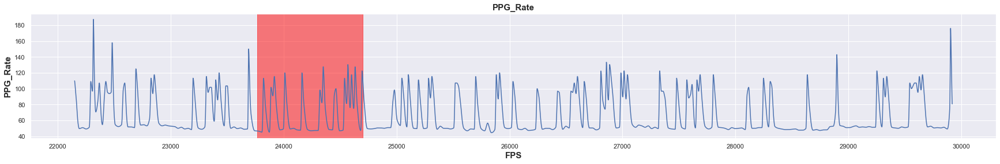

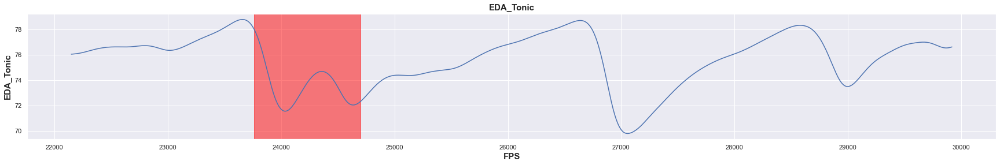

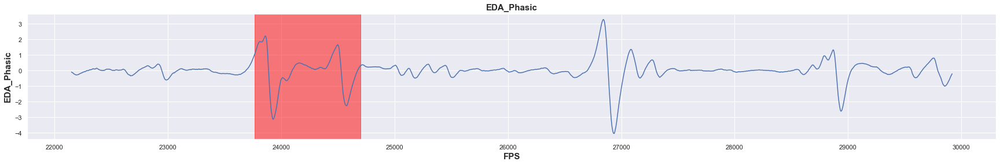

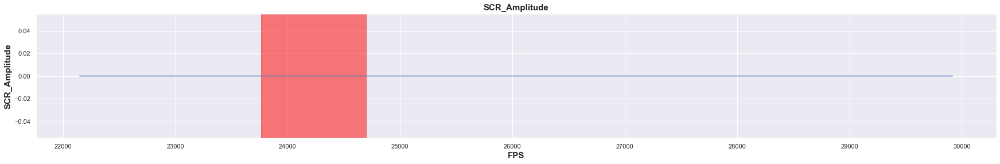

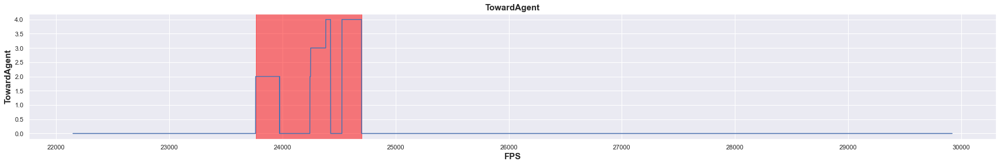

hyemin


<Figure size 432x288 with 0 Axes>

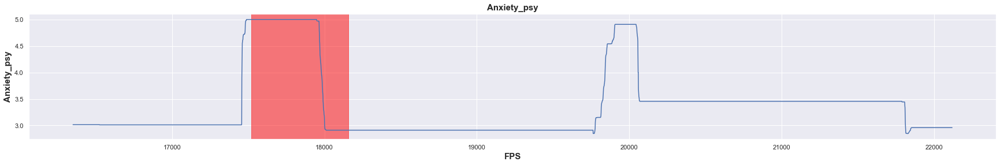

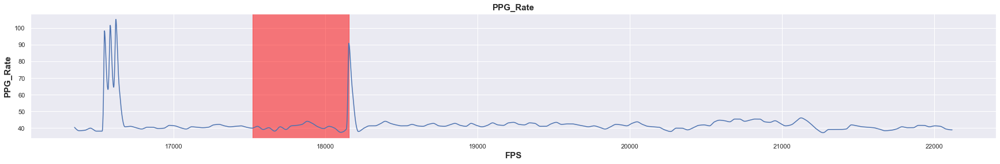

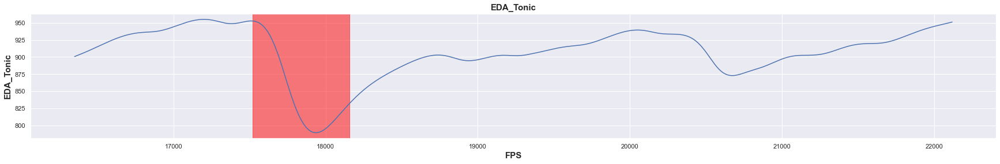

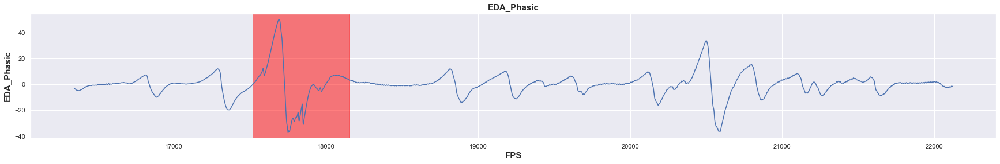

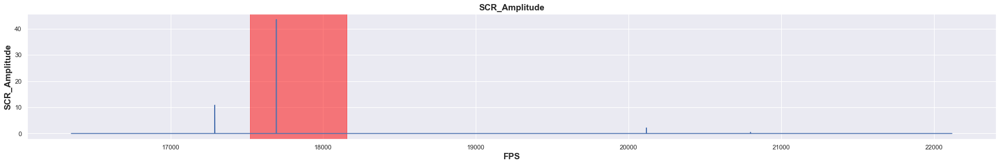

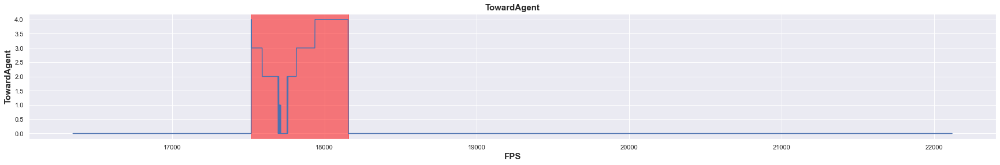

jaehoon


<Figure size 432x288 with 0 Axes>

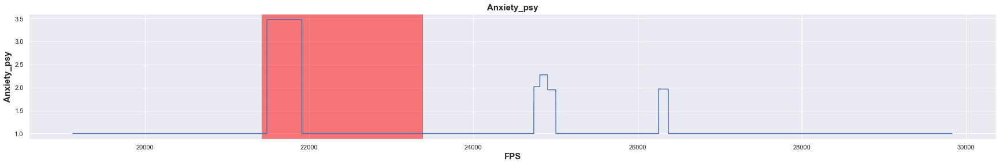

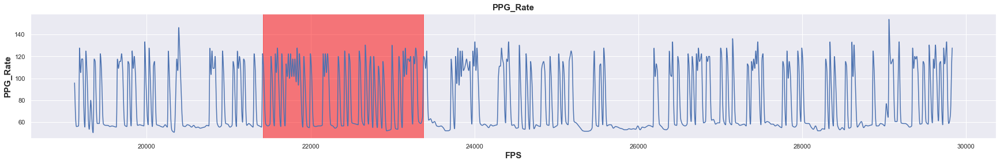

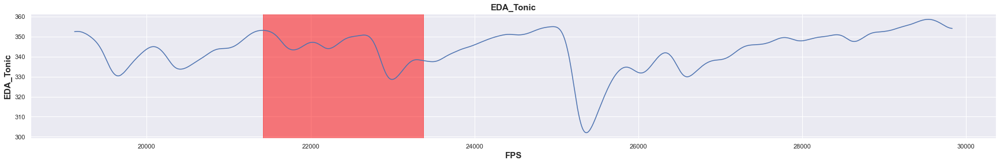

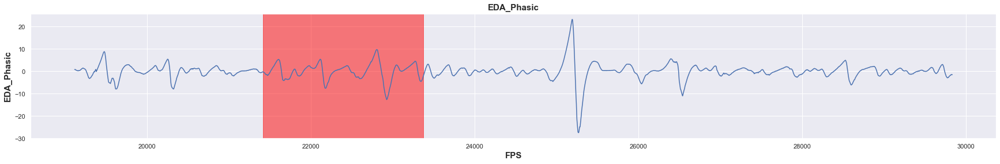

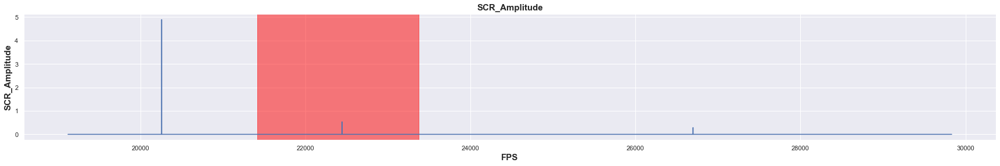

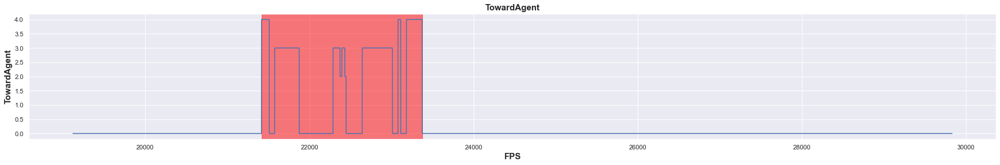

jaehyung


<Figure size 432x288 with 0 Axes>

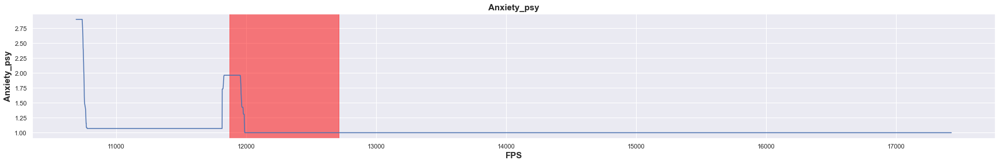

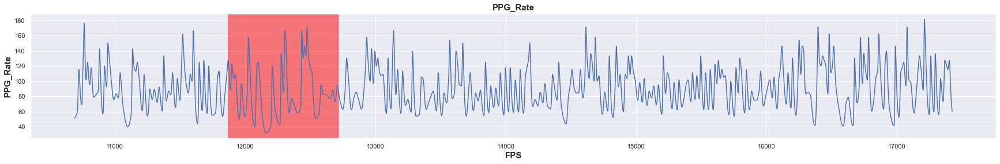

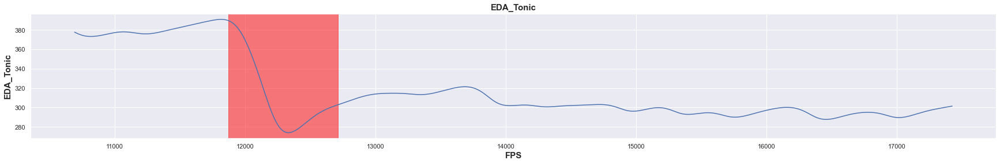

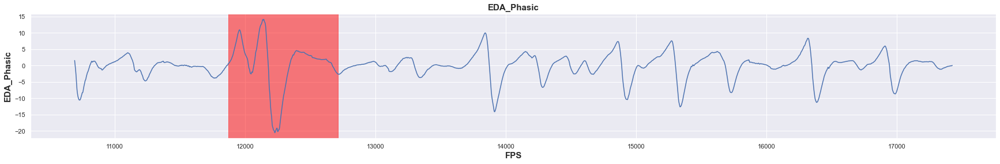

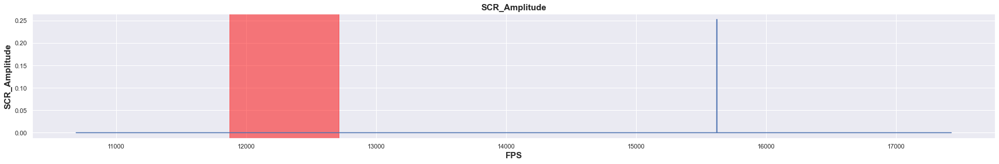

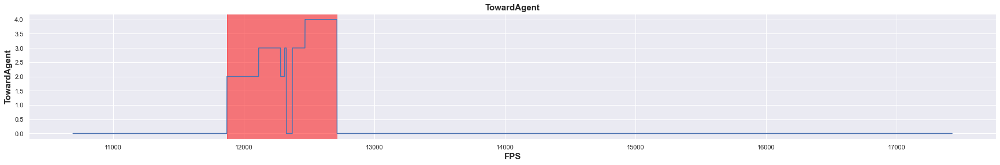

juyeon


<Figure size 432x288 with 0 Axes>

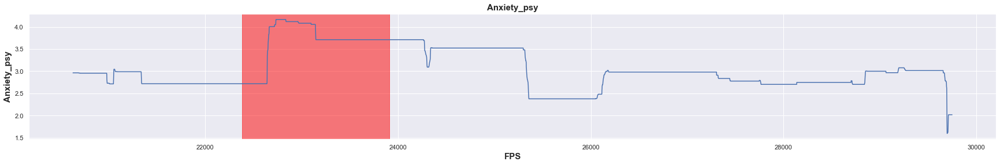

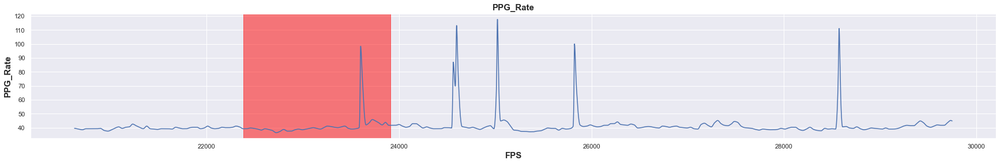

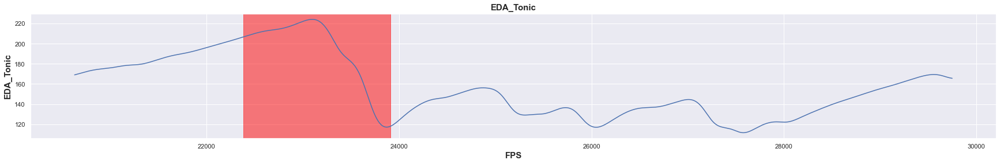

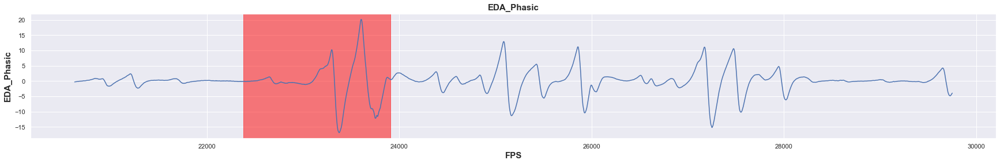

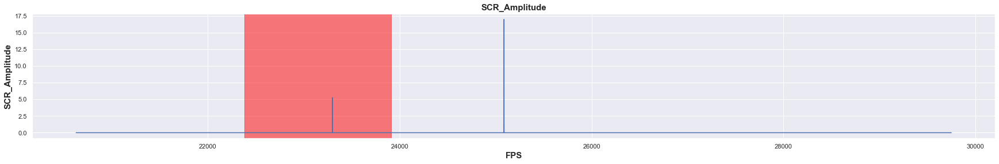

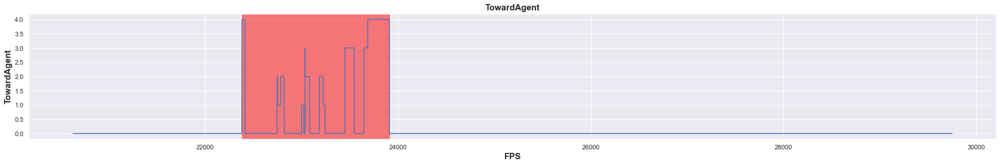

sangsu


<Figure size 432x288 with 0 Axes>

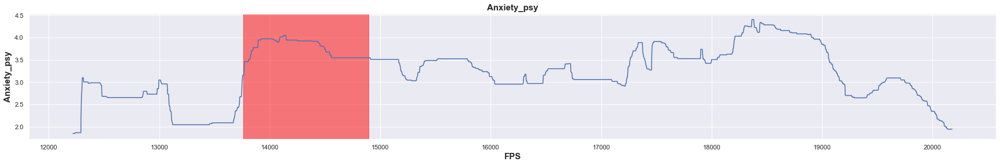

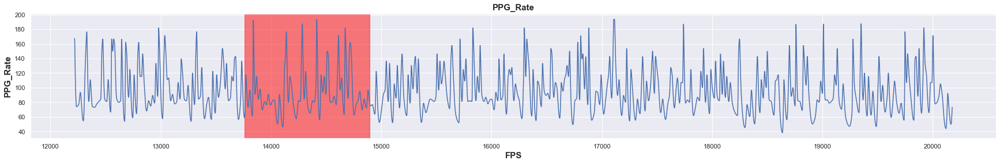

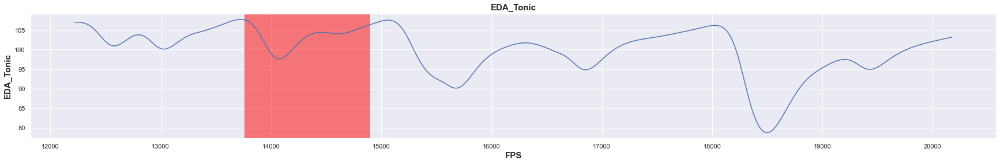

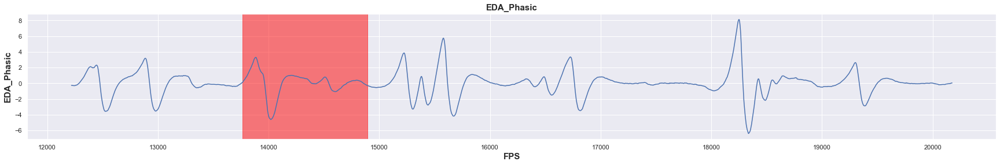

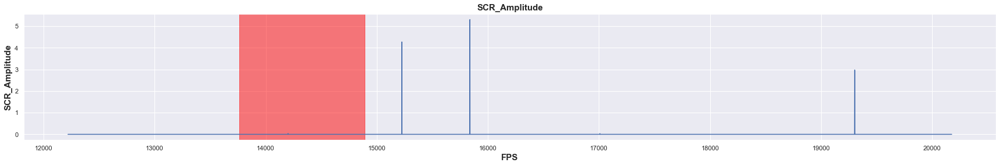

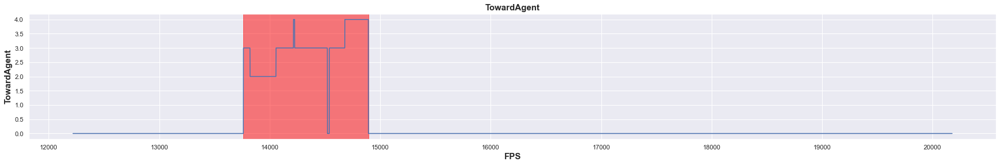

shihwa


<Figure size 432x288 with 0 Axes>

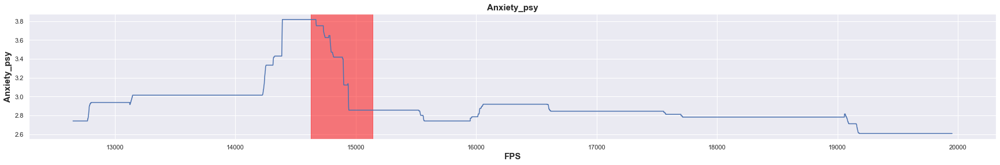

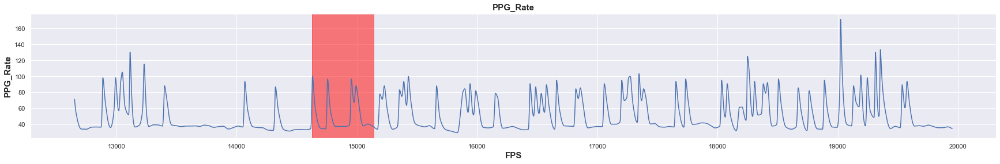

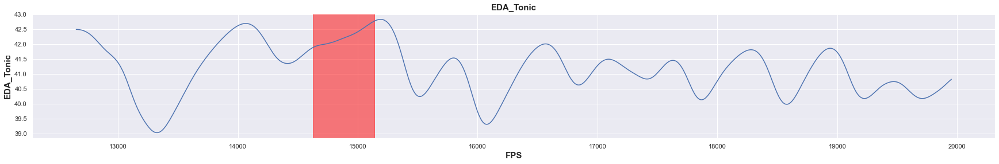

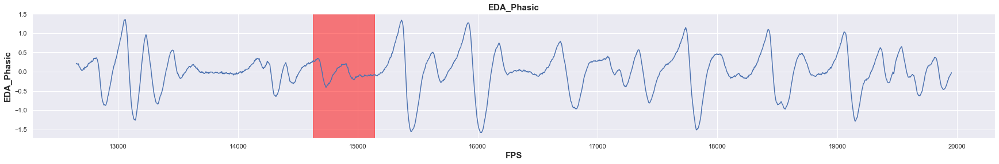

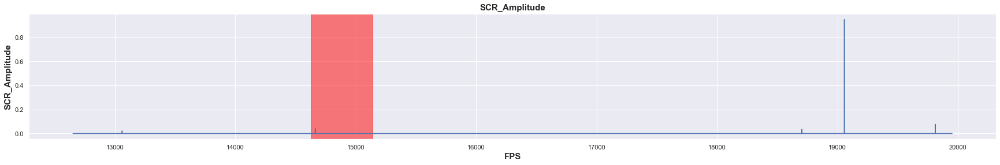

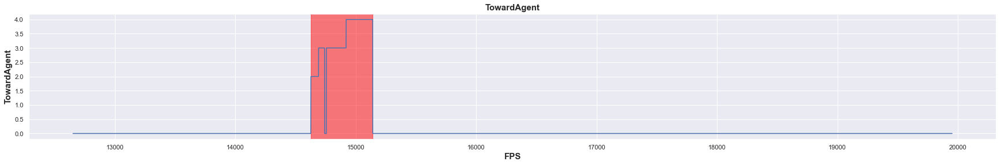

soomin


<Figure size 432x288 with 0 Axes>

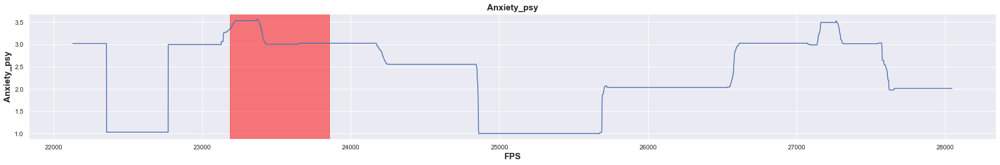

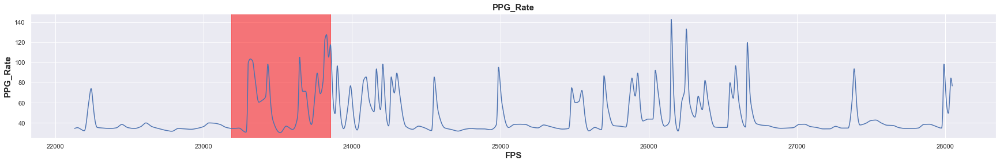

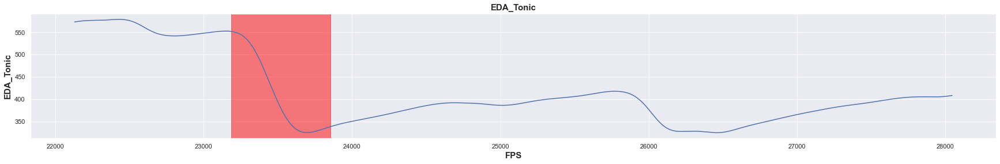

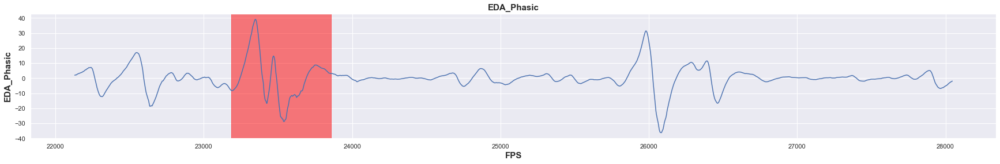

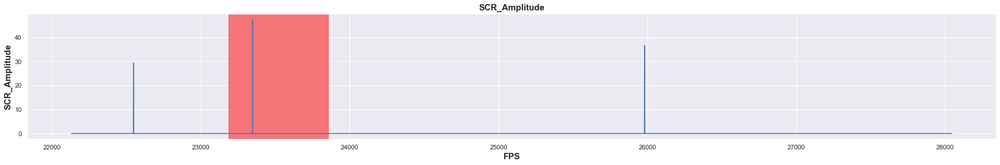

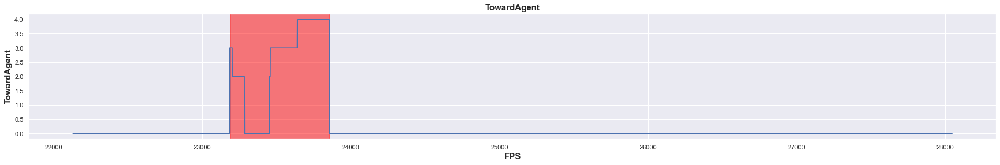

yoojung


<Figure size 432x288 with 0 Axes>

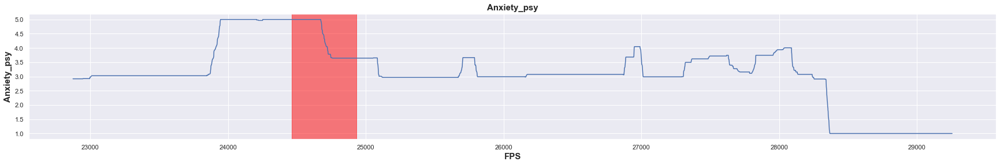

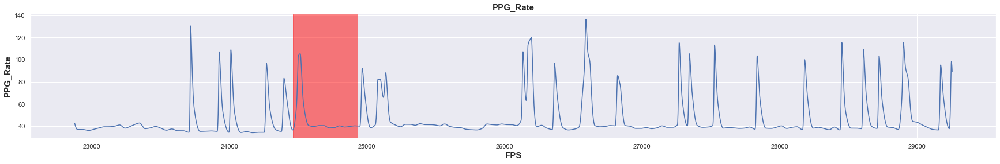

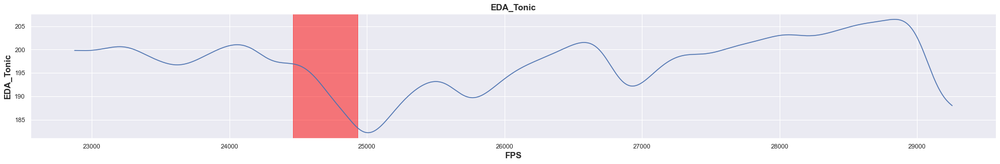

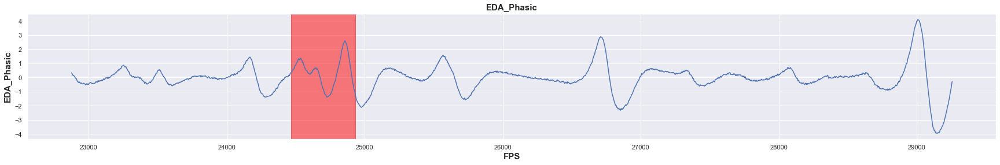

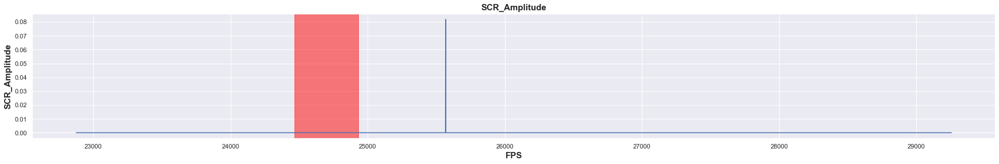

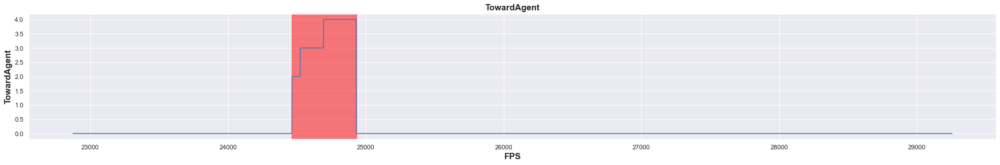

<Figure size 432x288 with 0 Axes>

In [117]:
size = (30,4)
lst=["Anxiety_psy", "PPG_Rate", "EDA_Tonic", "EDA_Phasic", "SCR_Amplitude", "TowardAgent"]
collist=['red','orange','green','blue']
for df in players: 
    participant = df["Subject"][0]
    print(participant)
    for item in lst:
        plt.figure(figsize=size)
        plt.title(item, fontsize=15, weight='bold')
        plt.ylabel(item, fontsize=15, weight='bold')
        plt.xlabel("FPS", fontsize=15, weight='bold')
        rangedf = df.loc[df["TowardAgent"]>0]
        sns.lineplot(x= "FPS", y=item,data=df[df["Scene"]=="Hallway"][:rangedf.index[-1]+3600])
        plt.axvspan(rangedf.index[0], rangedf.index[-1], color="red", alpha=0.5)
        
        # for idx in range(1,5):##4 is public and 1 is intimate
        #     _df = df.loc[df["TowardAgent"]==idx]
        #     if len(_df) > 0: 
        #         plt.scatter(x="FPS", y="TowardAgent", data=_df, color=collist[idx])
        plt.show()
    # createDir(f"./figures/{participant}")
    os.mkdir(f"./figures/{participant}") 
    plt.savefig(f"./figures/{participant}/{item}.png", bbox_inches='tight', dpi=300)
    


No handles with labels found to put in legend.


daehyun


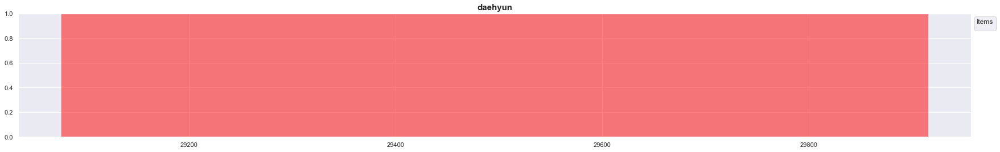

No handles with labels found to put in legend.


eunseo


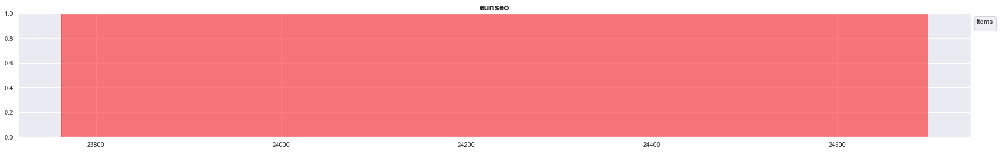

No handles with labels found to put in legend.


hyemin


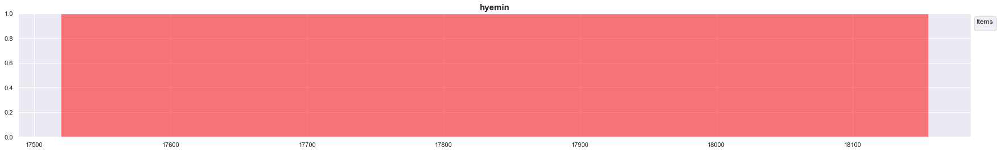

No handles with labels found to put in legend.


jaehoon


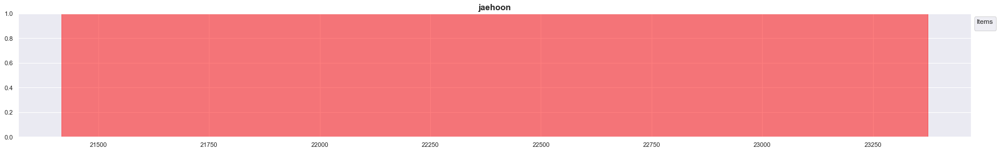

No handles with labels found to put in legend.


jaehyung


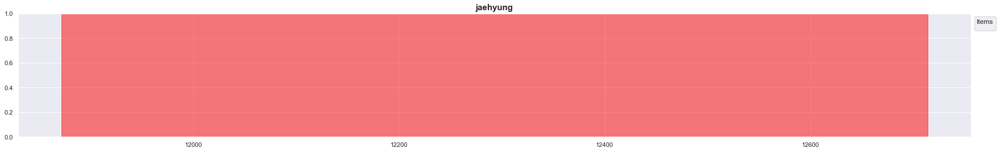

No handles with labels found to put in legend.


juyeon


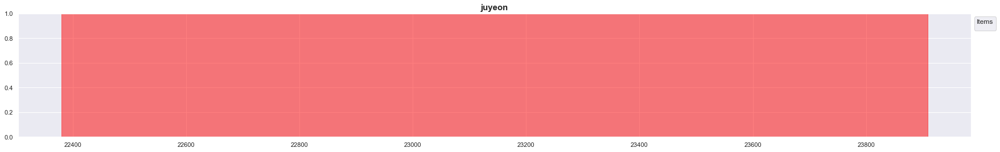

No handles with labels found to put in legend.


sangsu


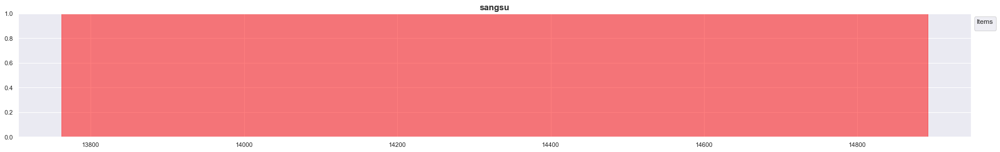

No handles with labels found to put in legend.


shihwa


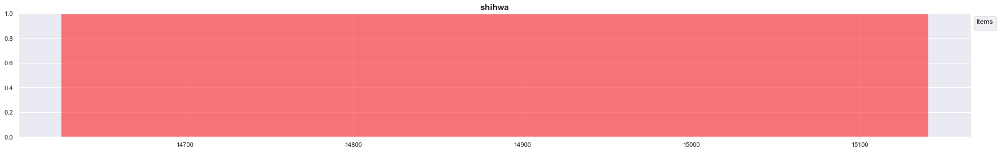

soomin


No handles with labels found to put in legend.


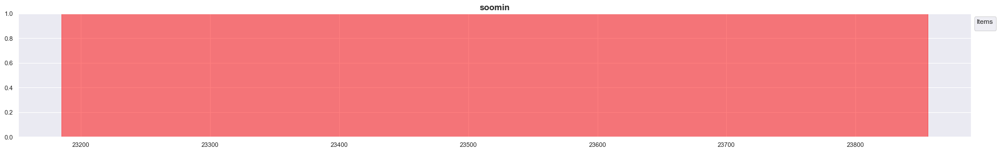

No handles with labels found to put in legend.


yoojung


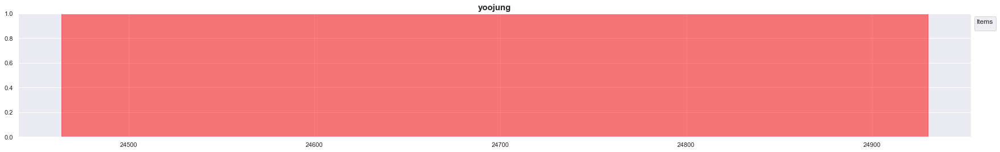

In [141]:
size = (30,4)
lst=["Anxiety_psy", "PPG_Rate", "EDA_Tonic", "EDA_Phasic", "SCR_Amplitude", "TowardAgent"]
collist=['red','orange','green','blue']
for df in players: 
    participant = df["Subject"][0]
    print(participant)
    plt.figure(figsize=size)
    plt.title(participant, fontsize=15, weight='bold')
    
    for item in lst:
        df[item]=((df[item]-df[item].min())/(df[item].max()-df[item].min()))*(5-1)+1
        rangedf = df.loc[df["TowardAgent"]>1]
        sns.lineplot(x= "FPS", y=item,data=df[df["Scene"]=="Hallway"][rangedf.index[0]-3600:rangedf.index[-1]+3600], label=item)
    
    plt.axvspan(rangedf.index[0], rangedf.index[-1], color="red", alpha=0.5)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Items')
    plt.show()
    # createDir(f"./figures/{participant}")
    # os.mkdir(f"./figures/{participant}") 
    # plt.savefig(f"./figures/{participant}/all.png", bbox_inches='tight', dpi=300)
    


In [121]:
df = df[item]
n_df=((df-df.min())/(df.max()-df.min()))*(5-1)+1

In [122]:
n_df

FPS
0        1.0
1        1.0
2        1.0
3        1.0
4        1.0
        ... 
44830    1.0
44831    1.0
44832    1.0
44833    1.0
44834    1.0
Name: TowardAgent, Length: 44793, dtype: float64

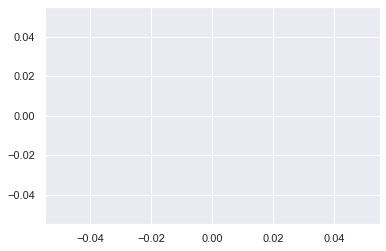

In [113]:
plt.plot(data=_df["TowardAgent"])
plt.show()

In [101]:
_df

,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,TowardAgent,Anxiety_psy,floor
FPS,,,,,,,,,,,,,,,,,,,,,
29135,94832.0,582.693294,71.07925,24.50426,-135.1111,daehyun,349.2630,278.1078,353.5812,0.0,...,0,1,1,0,0,0,1,1,3.625926,None
29136,94832.0,582.713070,71.06291,24.50423,-135.1235,daehyun,349.1993,278.0565,353.5439,0.0,...,0,1,1,0,0,0,1,1,3.625926,None
29137,94832.0,582.732784,71.04458,24.50429,-135.1380,daehyun,349.2052,278.0097,353.5169,0.0,...,0,1,1,0,0,0,1,1,3.625926,None
29138,94832.0,582.752498,71.03342,24.50424,-135.1470,daehyun,349.1937,277.9886,353.4910,0.0,...,0,1,1,0,0,0,1,1,3.625926,None
29139,94832.0,582.772274,71.01476,24.50410,-135.1620,daehyun,349.2079,277.9899,353.4497,0.0,...,0,1,1,0,0,0,1,1,3.625926,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29199,94832.0,583.971371,70.00038,24.50427,-135.1938,daehyun,348.9157,278.1643,353.1099,0.0,...,0,1,1,0,0,0,1,1,3.725926,None
29200,94832.0,583.991146,69.97542,24.50416,-135.1960,daehyun,348.9260,278.1982,353.1499,0.0,...,0,1,1,0,0,0,1,1,3.725926,None
29201,94832.0,584.010860,69.95654,24.50428,-135.1975,daehyun,348.9467,278.2199,353.1557,0.0,...,0,1,1,0,0,0,1,1,3.725926,None


In [87]:
whole_df.loc[whole_df["TowardAgent"]==2]

,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,TowardAgent,Anxiety_psy,floor
FPS,,,,,,,,,,,,,,,,,,,,,
24464,94860.0,489.273083,68.73614,24.44844,-134.8830,yoojung,351.8933,283.4152,354.7353,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24465,94860.0,489.292736,68.71930,24.44838,-134.8661,yoojung,351.9211,283.4449,354.7139,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24466,94860.0,489.312450,68.71930,24.44838,-134.8661,yoojung,351.9211,283.4449,354.7139,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24467,94860.0,489.332165,68.70241,24.44840,-134.8489,yoojung,351.8732,283.4822,354.6774,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24468,94860.0,489.351879,68.68288,24.44836,-134.8289,yoojung,351.8465,283.5326,354.6170,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24469,94860.0,489.371593,68.66759,24.44840,-134.8134,yoojung,351.8372,283.5422,354.5885,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24470,94860.0,489.391308,68.66759,24.44844,-134.8135,yoojung,351.8372,283.5634,354.5826,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24471,94860.0,489.411083,68.66759,24.44844,-134.8135,yoojung,351.8372,283.5634,354.5826,0.0,...,0,1,0,1,0,0,1,2,5.0,None
24472,94860.0,489.430797,68.66747,24.44844,-134.8133,yoojung,351.8136,283.5672,354.5705,0.0,...,0,1,0,1,0,0,1,2,5.0,None


In [81]:
whole_df.loc[whole_df["TowardAgent"]>0].index[0]

24464

In [73]:
whole_df.columns

Index(['SubjectID', 'Time', 'X_pos', 'Y_pos', 'Z_pos', 'Subject', 'X_rot',
       'Y_rot', 'Z_rot', 'zone', 'risktake', 'index', 'Scene', 'EDA_Raw',
       'EDA_Clean', 'EDA_Tonic', 'EDA_Phasic', 'SCR_Onsets', 'SCR_Peaks',
       'SCR_Height', 'SCR_Amplitude', 'SCR_RiseTime', 'SCR_Recovery',
       'SCR_RecoveryTime', 'PPG_Raw', 'PPG_Clean', 'PPG_Rate', 'PPG_Quality',
       'PPG_Peaks', 'type', 'Intimate', 'Personal', 'Social', 'Public',
       'Total', 'Intimate_IS', 'Personal_IS', 'Social_IS', 'Public_IS',
       'Total_IS', 'Intimate_IT', 'Personal_IT', 'Social_IT', 'Public_IT',
       'Total_IT', 'TowardAgent', 'Anxiety_psy', 'floor'],
      dtype='object')

In [31]:
subjects[subjects["ID"]==subid][" Name"].values[0].split("_")

[' 6', '0', 'm', '17']

In [32]:
whole_df.loc[whole_df['Scene']=='Hallway', 'zone']

FPS
18787    0.0
18788    0.0
18789    0.0
18790    0.0
18791    0.0
        ... 
35821    6.0
35822    6.0
35823    6.0
35824    6.0
35825    6.0
Name: zone, Length: 17039, dtype: float32

In [41]:
df = players[0]
df[df["Scene"]=="Hallway"][["Time","zone"]]

,Time,zone
FPS,,
10536,210.712520,0.0
10537,210.732051,0.0
10538,210.751582,0.0
10539,210.771114,0.0
10540,210.790614,0.0
...,...,...
15856,317.111537,6.0
15857,317.131069,6.0
15858,317.150600,6.0


In [8]:
players[0].columns

Index(['SubjectID', 'Time', 'X_pos', 'Y_pos', 'Z_pos', 'Subject', 'X_rot',
       'Y_rot', 'Z_rot', 'zone', 'risktake', 'index', 'Scene', 'EDA_Raw',
       'EDA_Clean', 'EDA_Tonic', 'EDA_Phasic', 'SCR_Onsets', 'SCR_Peaks',
       'SCR_Height', 'SCR_Amplitude', 'SCR_RiseTime', 'SCR_Recovery',
       'SCR_RecoveryTime', 'PPG_Raw', 'PPG_Clean', 'PPG_Rate', 'PPG_Peaks',
       'type', 'Intimate', 'Personal', 'Social', 'Public', 'Total',
       'Intimate_IS', 'Personal_IS', 'Social_IS', 'Public_IS', 'Total_IS',
       'Intimate_IT', 'Personal_IT', 'Social_IT', 'Public_IT', 'Total_IT',
       'Anxiety_psy'],
      dtype='object')

In [20]:
df[df["zone"]==1][]

,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Social_IS,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,Anxiety_psy,space
FPS,,,,,,,,,,,,,,,,,,,,,
12900,89722.0,257.993923,60.20405,23.970380,-123.12250,cansu,0.0,90.0,0.0,1.0,...,1,2,3,0,0,0,0,0,1.981481,Social
12901,89722.0,258.013454,60.20405,23.970380,-123.12250,cansu,0.0,90.0,0.0,1.0,...,1,2,3,0,0,0,0,0,1.981481,Social
12902,89722.0,258.032955,60.21558,23.970380,-123.09760,cansu,0.0,90.0,0.0,1.0,...,1,2,3,0,0,0,0,0,1.981481,Social
12903,89722.0,258.052486,60.22835,23.970380,-123.07000,cansu,0.0,90.0,0.0,1.0,...,1,2,3,0,0,0,0,0,1.981481,Social
12904,89722.0,258.072048,60.23885,23.970380,-123.04730,cansu,0.0,90.0,0.0,1.0,...,1,2,3,0,0,0,0,0,1.981481,Social
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38710,138680.0,774.191260,-48.02674,-0.428001,18.07303,jinhee,0.0,90.0,0.0,1.0,...,0,0,0,0,0,0,0,0,3.207407,Public
38711,138680.0,774.210914,-48.02674,-0.428001,18.07303,jinhee,0.0,90.0,0.0,1.0,...,0,0,0,0,0,0,0,0,3.207407,Public
38712,138680.0,774.230628,-48.02674,-0.428001,18.07303,jinhee,0.0,90.0,0.0,1.0,...,0,0,0,0,0,0,0,0,3.207407,Public


In [18]:
df = pd.concat([players[0],players[1]])
df["space"] = math.nan
df.loc[df["Intimate"] == 1 ,"space"] = "Intimate"
df.loc[df["Personal"] == 1 ,"space"] = "Personal"
df.loc[df["Social"] == 1 ,"space"] = "Social"
df.loc[df["Public"] == 1 ,"space"] = "Public"
df.loc[() ,"space"] = 'base'
df = df.dropna()

df

,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Social_IS,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,Anxiety_psy,space
FPS,,,,,,,,,,,,,,,,,,,,,
0,56828.0,0.004360,23.07200,1.009000,-68.46700,cansu,0.0,90.0,0.0,0.0,...,0,0,0,0,0,0,0,0,2.992593,base
1,56828.0,0.014125,23.07200,1.009000,-68.46700,cansu,0.0,90.0,0.0,0.0,...,0,0,0,0,0,0,0,0,2.992593,base
2,56828.0,0.033656,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0,0,0,0,0,0,0,0,2.992593,base
3,56828.0,0.053188,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0,0,0,0,0,0,0,0,2.992593,base
4,56828.0,0.072719,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0,0,0,0,0,0,0,0,2.992593,base
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39167,138680.0,783.332618,-38.53477,-0.428001,24.44880,jinhee,0.0,90.0,0.0,2.0,...,0,0,0,0,0,0,0,0,3.207407,Public
39168,138680.0,783.352271,-38.50969,-0.428001,24.46322,jinhee,0.0,90.0,0.0,2.0,...,0,0,0,0,0,0,0,0,3.207407,Public
39169,138680.0,783.371985,-38.48489,-0.428001,24.47748,jinhee,0.0,90.0,0.0,2.0,...,0,0,0,0,0,0,0,0,3.207407,Public


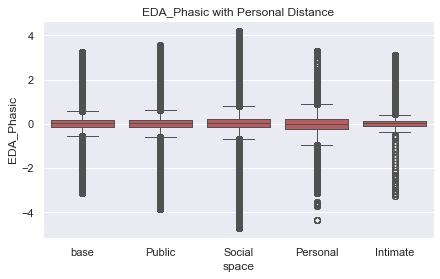

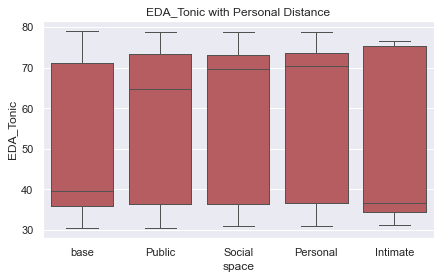

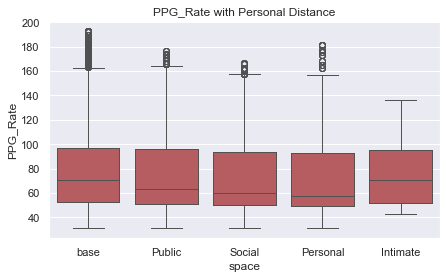

In [54]:
space = ['Intimate', 'Personal', 'Social', 'Public']
# itemlst = ["PPG_Rate"]
# itemlst = ["SCR_Height", "SCR_Amplitude", "SCR_RiseTime"]
itemlst = ["EDA_Phasic", "EDA_Tonic", "PPG_Rate"]


# df = players[0].groupby(['mask','name','number','space']).mean().reset_index()
# df = pd.concat([players[0],players[1]])
# df = players[1].copy()
df = pd.concat([players[0],players[1]])
df["space"] = math.nan
df.loc[df["Intimate"] == 1 ,"space"] = "Intimate"
df.loc[df["Personal"] == 1 ,"space"] = "Personal"
df.loc[df["Social"] == 1 ,"space"] = "Social"
df.loc[df["Public"] == 1 ,"space"] = "Public"
df.loc[(df["Intimate"] == 0)&(df["Personal"] == 0)&(df["Social"] == 0)&(df["Public"] == 0) ,"space"] = 'base'
df = df.dropna()

# ax = sns.catplot(x=x, y=y, palette='Set2', data=df, kind="bar")
# ax.fig.subplots_adjust(top=0.87) # adjust the Figure in rp
# ax.fig.suptitle(name, size=17)
# ax.set_titles(size=13)
# savename = name + 'barplot'
# plt.ylim([2,4.5])
# plt.savefig(f'graphs/overleaf/PersonalDistance_main/{savename}.png', bbox_inches='tight')
# sns.barplot(x='space', y= 'Anxiety', palette='Set2',hue='number', data=pdist_m[pdist_m['space']=='social'])
size = (7,4)
for item in itemlst:
    plt.figure(figsize=size)
    for dist in space:
        name = f'{item} with Personal Distance'
        # sns.catplot(x=dist, y=y, palette='Set2', data=df, kind="bar")
        # sns.boxplot(x=dist, y=item, data=df);
        sns.boxplot(x="space", y=item, data=df);
        
        # sns.lineplot(x=dist, y=item, data=df,label= item+"_"+dist)
        plt.title(name)
    plt.show()
# plt.show()


,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Personal_IS,Social_IS,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,Anxiety_psy
FPS,,,,,,,,,,,,,,,,,,,,,
0,56828.0,0.003669,23.07200,1.009000,-68.46700,jinhee,0.0,270.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,2.288889
1,56828.0,0.013526,23.07200,1.009000,-68.46700,jinhee,0.0,270.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,2.288889
2,56828.0,0.033210,23.07200,0.877000,-68.46700,jinhee,0.0,270.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,2.288889
3,56828.0,0.052909,23.07200,0.877000,-68.46700,jinhee,0.0,270.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,2.288889
4,56828.0,0.072593,23.07200,0.877000,-68.46700,jinhee,0.0,270.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,2.288889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39167,138680.0,783.332618,-38.53477,-0.428001,24.44880,jinhee,0.0,90.0,0.0,2.0,...,0,0,0,0,0,0,0,0,0,3.207407
39168,138680.0,783.352271,-38.50969,-0.428001,24.46322,jinhee,0.0,90.0,0.0,2.0,...,0,0,0,0,0,0,0,0,0,3.207407
39169,138680.0,783.371985,-38.48489,-0.428001,24.47748,jinhee,0.0,90.0,0.0,2.0,...,0,0,0,0,0,0,0,0,0,3.207407


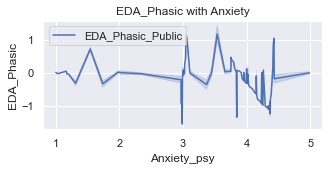

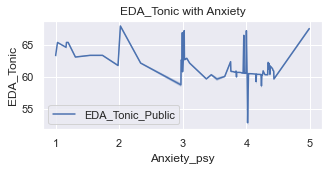

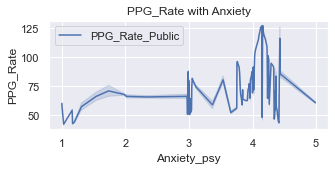

In [81]:
# df = pd.concat([players[0],players[1]])
df = players[0].copy()

for item in itemlst:
    plt.figure(figsize=(5,2))
    name = f'{item} with Anxiety'
    sns.lineplot(x="Anxiety_psy", y=item, data=df,label= item+"_"+dist)
    plt.title(name)
    plt.show()

In [ ]:
zone = subjects[subjects["ID"]==subid][" Name"].values[0].split("_")[-3]

In [62]:
df = unity['customevent']["Elevator"][0].copy()
df["Actor"] = df["Actor"].str.replace('"',"").str.split("_")
df

,ID,Time,Action,Actor,1,2,3,4,Subject
1,-1,391.6346,Animator,"[ 5, 8, 3-G, m, 21]","Zone_m_blend""",None,None,None,cansu
2,-1,391.6346,LookAtSetting,"[ 5, 8, 3-G, m, 21]",IKactive,True,Sensitive,"False""",cansu
3,-1,391.6346,Animator,"[ 5, 3-0, f, 1]","Elv_f_blend""",None,None,None,cansu
4,-1,391.6346,LookAtSetting,"[ 5, 3-0, f, 1]",IKactive,False,Sensitive,"False""",cansu
5,-1,391.6346,Animator,"[ 5, 8, 3-G, f, 19]","Zone_f_blend""",None,None,None,cansu
...,...,...,...,...,...,...,...,...,...
25616,-1,612.2543,TouchPad,[ Player],(0.02,"0.72)""",None,None,cansu
25617,-1,612.2543,Animation,"[ 5, 8, 3-G, m, 20]","0""",None,None,None,cansu
25618,-1,612.2543,Animation,"[ 5, 8, 3-G, f, 19]","4""",None,None,None,cansu
25619,-1,612.2556,Status,[ Player],Scene,5,"end""",None,cansu


In [64]:
#### Abnormal PPG peak detector
for ppl in range(len(players)):
    _df = players[ppl]
    _min = len(_df)/6000
    for m in range(math.floor(_min)):
        __df  = _df[m:(m+1)*6000]
        hb = len(__df[__df["PPG_Peaks"]==1])
        if hb>100 | hb<60:
            print(f"Abnormal Heart Beat detected at {m}minute")
            plt.figure(figsize=(25,3))
            sns.lineplot(x= "FPS", y="PPG_Peaks",data=_df[m:(m+1)*6000])
            plt.show()

In [34]:
import neurokit2 as nk

In [112]:
_df = players[0]
_df_g = nk.eda_process(_df["GSR_CAL"], sampling_rate=100)[0].reset_index()
_df_p = nk.ppg_process(_df["Internal ADC A13_CAL"], sampling_rate=100)[0].reset_index()



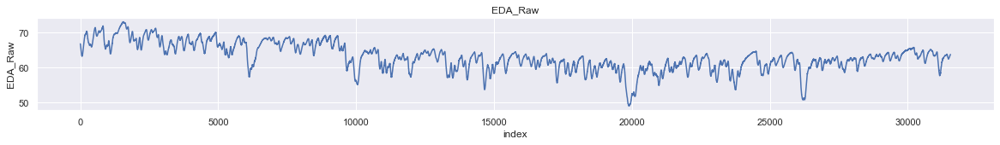

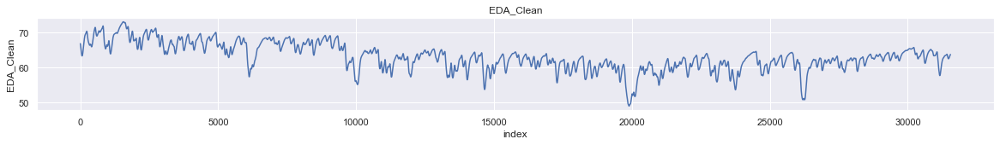

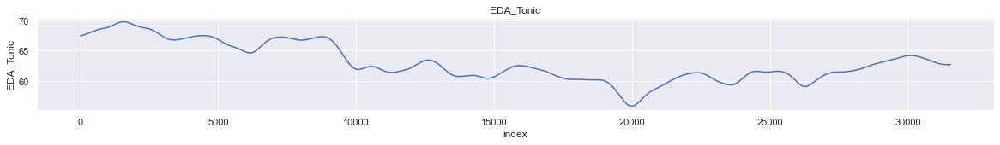

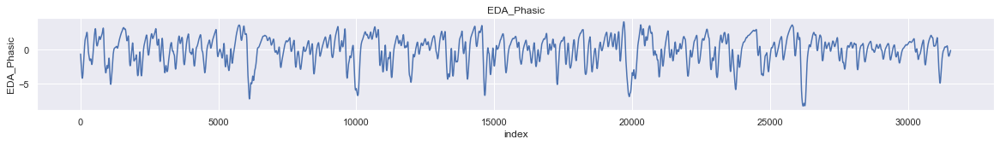

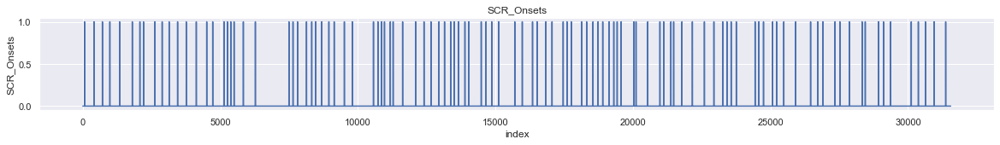

...

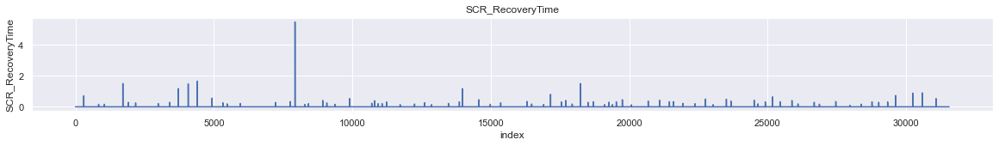

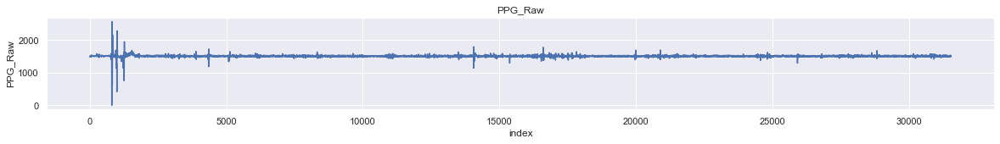

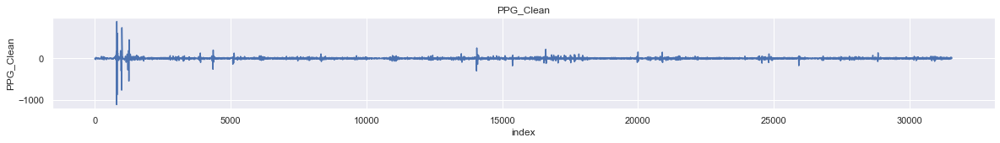

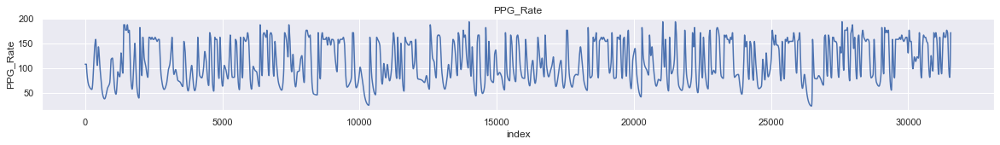

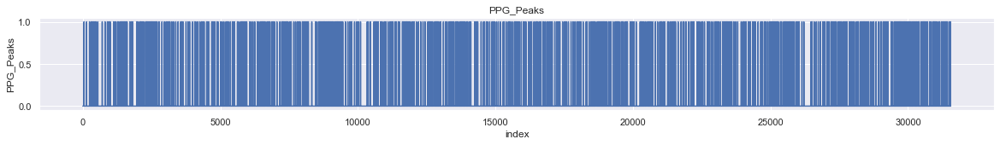

In [115]:
size = (20,2)

for items in _df_g.columns:
    if items != 'index':
        plt.figure(figsize=size)
        plt.title(items)
        sns.lineplot(x= "index", y=items,data=_df_g)
        plt.show()   
for items in _df_p.columns:
    if items != 'index':
        plt.figure(figsize=size)
        plt.title(items)
        sns.lineplot(x= "index", y=items,data=_df_p)
        plt.show()


In [8]:
whole_df[whole_df["Social_IS"]==1]

,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Personal_IS,Social_IS,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,Anxiety_psy
FPS,,,,,,,,,,,,,,,,,,,,,
2735,56780.0,54.693697,53.31041,0.920,-78.004120,serin,0.0,90.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.614815
2736,56780.0,54.716005,53.30803,0.920,-78.032780,serin,0.0,90.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.574074
2737,56780.0,54.738100,53.30573,0.920,-78.061720,serin,0.0,90.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.566667
2738,56780.0,54.760286,53.30573,0.920,-78.061720,serin,0.0,90.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.566667
2739,56780.0,54.771486,53.30573,0.920,-78.061720,serin,0.0,90.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.566667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33374,138524.0,667.465100,-50.64896,-0.499,1.786106,serin,0.0,270.0,0.0,1.0,...,0.0,1.0,1.0,2.0,0.0,0.0,1.0,0.0,1.0,2.792593
33375,138524.0,667.509300,-50.70309,-0.499,1.806846,serin,0.0,270.0,0.0,1.0,...,0.0,1.0,1.0,2.0,0.0,0.0,1.0,0.0,1.0,2.770370
33376,138524.0,667.509300,-50.70309,-0.499,1.806846,serin,0.0,270.0,0.0,1.0,...,0.0,1.0,1.0,2.0,0.0,0.0,1.0,0.0,1.0,2.770370


In [57]:
_df = pd.DataFrame()
for df in players:
    _df = pd.concat([_df, df], axis=0)
    
_df = _df.reset_index(drop=True)

In [10]:
_df

,SubjectID,Time,X_pos,Y_pos,Z_pos,Subject,X_rot,Y_rot,Z_rot,zone,...,Personal_IS,Social_IS,Public_IS,Total_IS,Intimate_IT,Personal_IT,Social_IT,Public_IT,Total_IT,Anxiety_psy
0,56828.0,0.000000,23.07200,1.009000,-68.46700,cansu,0.0,90.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.992593
1,56828.0,0.019990,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.992593
2,56828.0,0.019990,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.992593
3,56828.0,0.019990,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.992593
4,56828.0,0.019990,23.09120,0.877000,-68.48093,cansu,0.0,90.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.992593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294932,138524.0,699.775484,-38.51057,-0.428001,24.20276,serin,0.0,270.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.651852
294933,138524.0,699.790071,-38.51057,-0.428001,24.20276,serin,0.0,270.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.651852
294934,138524.0,699.816805,-38.46807,-0.428001,24.23808,serin,0.0,270.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.651852
294935,138524.0,699.839022,-38.44697,-0.428001,24.25564,serin,0.0,270.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.651852


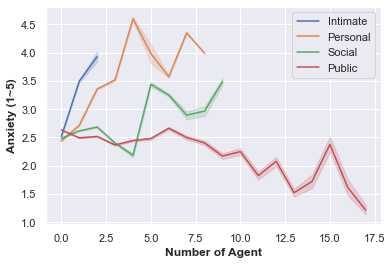

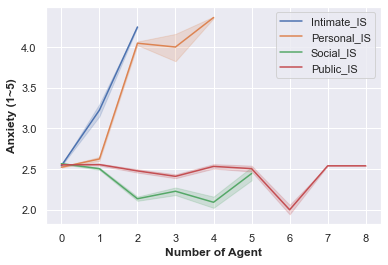

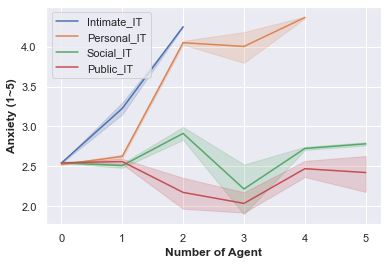

In [58]:
space = ['Intimate', 'Personal', 'Social', 'Public']
adds = ["", "_IS", "_IT"]
# whole_df[space]
for add in adds:
    for item in space:
        sns.lineplot(x=item+add, y="Anxiety_psy", data=_df, label= item+add)
    plt.xlabel('Number of Agent', weight='bold')
    plt.ylabel("Anxiety (1~5)", weight='bold')   
    plt.legend()
    plt.show()

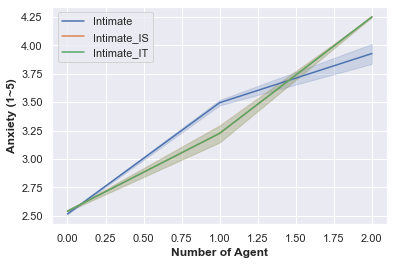

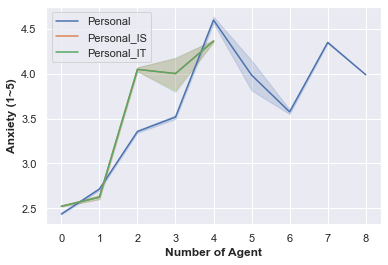

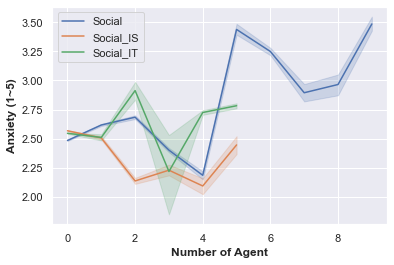

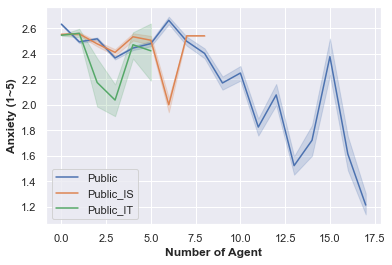

In [59]:
space = ['Intimate', 'Personal', 'Social', 'Public']
adds = ["", "_IS", "_IT"]
# whole_df[space]
for item in space:
    for add in adds:
        sns.lineplot(x=item+add, y="Anxiety_psy", data=_df, label= item+add)
    plt.xlabel('Number of Agent', weight='bold')
    plt.ylabel("Anxiety (1~5)", weight='bold')   
    plt.legend()
    plt.show()

In [ ]:
#Plotting and one way anova 
space = ['intimate', 'personal', 'social', 'public']
name = 'Anxiety Mean of Personal Distance'
x, y='space','Anxiety'
mean_sp = singlepd_paired.groupby('space').mean().reindex(['intimate','personal','social','public','base']).reset_index()
result = singlepd_paired.groupby(['space'])['Anxiety'].aggregate(np.mean).reset_index().sort_values('Anxiety')
pallete = 'RdYlGn'
plt.figure(figsize=[7.5,5])
ax = sns.barplot(x=x, y=y, palette=pallete, data=singlepd_paired, order=['intimate','personal','social','public','base'])
sns.regplot(x=np.arange(0,len(mean_sp)), y=y,ax=ax, data=mean_sp)
plt.xlabel('Zone', fontsize=25, weight='bold')
plt.ylabel(y+'(1~5)', fontsize=25, weight='bold')
# plt.title(name, fontsize=20)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
ax.tick_params(axis='x', labelsize=20)
plt.ylim([2,3.3])
print('____________________________')
print('Overall')
formula = """Anxiety ~ space"""J
lm = ols(formula, singlepd_paired).fit()
print(sm.stats.anova_lm(lm, typ=2))
# savename = name + pallete
# savename = name
# plt.savefig(f'D:/OneDrive/HubRoom/Projects/Social Distance/Writing/새 폴더/Highresolution/{savename}.png', bbox_inches='tight', dpi=300)
# # plt.savefig(f'C:/Users/Jiyoon/OneDrive/HubRoom/Projects/Social Distance/Writing/새 폴더/{savename}.png'
# #             , bbox_inches='tight', dpi=300)


### Transform Preprocessing

In [ ]:
'''Player/Agent 를 구분하여 새로운 DF를 만들고 빈 부분을 채움. Rotation value 포함'''
scene = "Elevator"
idx = 0
position_df = unity["position"][scene][idx].drop(["Subject"], axis=1)
rotation_df = unity["rotation"][scene][idx].drop(["Subject"], axis=1)

#Fix column Name-remove unnecessary blank
position_df.columns  = ['SubjectID', 'Time', 'X', 'Y', 'Z'] # 컬럼명 변경 
rotation_df.columns  = ['SubjectID', 'Time', 'X', 'Y', 'Z'] # 컬럼명 변경 
subject_ID_list = position_df['SubjectID'].unique().tolist() #Agent 개체들과 Player 구분을 위한 Subject ID list
player_ID = position_df['SubjectID'].unique().tolist()[-1] #Player Subject ID

#Divide into Each Subject ID
player_pos_df = position_df[position_df['SubjectID'] == player_ID]
player_rot_df = rotation_df[rotation_df['SubjectID'] == player_ID]
test_pos_list = list()
test_rot_list = list()
all_list = list()
allinone = list()



for ID in subject_ID_list:
    #Divide into Each Subject ID
    agent_pos_df = position_df[position_df['SubjectID'] == ID]
    agent_rot_df = rotation_df[rotation_df['SubjectID'] == ID]


    #Index reset
    ##Position
    tmp_player_pos = player_pos_df.reset_index().drop('index',axis=1)
    tmp_agent_pos = agent_pos_df.reset_index().drop('index',axis=1)
    ##Rotation
    tmp_player_rot = player_rot_df.reset_index().drop('index',axis=1)
    tmp_agent_rot = agent_rot_df.reset_index().drop('index',axis=1)
    
    #Drop Duplicated values
    tmp_agent_pos = tmp_agent_pos.drop_duplicates(['Time'], keep='first')
    tmp_agent_rot = tmp_agent_rot.drop_duplicates(['Time'], keep='first')


    #Merge into one df
    test_pos = pd.merge(left = tmp_player_pos, right = tmp_agent_pos, how='left', on='Time', suffixes=('_1','_2'))
    test_rot = pd.merge(left = tmp_player_rot, right = tmp_agent_rot, how='left', on='Time', suffixes=('_1','_2'))


    #비어있는 Subject ID_2 컬럼은 어차피 ID가 들어가므로 그냥 채워준다.
    test_pos['SubjectID_2'] = ID
    test_rot['SubjectID_2'] = ID
    #비어있는 Subject ID_1 컬럼은 어차피 ID가 들어가므로 그냥 채워준다.
    test_pos['SubjectID_1'] = player_ID
    test_rot['SubjectID_1'] = player_ID
    
    
    test_pos.sort_values(by='Time', axis=0, ascending=True, 
                            inplace=True, kind='quicksort', 
                            na_position='last')
    
    
    allinone = pd.merge(test_pos, test_rot, on='Time', how='outer',suffixes=('_pos','_rot'))
    #print(allinone.count())
    
    

    #Fill in missing data 
    allinone = allinone.fillna(method = 'ffill')

    allinone = allinone.dropna(axis=0)
    allinone = allinone.reset_index().drop('index',axis=1)
    
    #print(len(allinone))

    all_list.append(allinone)

In [ ]:

transforms = defaultdict(dict)
scenes = ["Outside", "Hallway", "Elevator", "Hall"]
for scene in scenes:
    print(scene)
    ppls = len(unity["position"][scene])
    for ppl in range(ppls):
        print(ppl)
        df_p = unity["position"][scene][ppl].drop(["Subject"], axis=1)
        df_r = unity["rotation"][scene][ppl].drop(["Subject"], axis=1)
        transform = dl.playertransform(df_p, df_r)
        dist = dl.distance_uclid(transform)
        name = names[ppl]
        # print(name)
        for idx in range(len(transform)):
            df = transform[idx]
            if df['SubjectID_1_pos'][0] == df['SubjectID_2_pos'][0]:
                df['case'] = 'participant'
            else:
                df['case'] = 'agent'    
            df = df.drop(columns=['SubjectID_1_pos', 'X_1_pos', 'Y_1_pos', 
                                'Z_1_pos', 'SubjectID_1_rot', 'X_1_rot', 'Y_1_rot', 'Z_1_rot',
                                'Y_2_pos', 'X_2_rot', 'Z_2_rot', 'SubjectID_2_rot','SubjectID_2_pos'])
            df['distance'] = dist[idx]
            df['name'] = name
            
            identifier = f"{scene}"
            # transform[idx] = df[df['distance']<7.6].reset_index(drop=True)
            transform[idx] = df
            zone_list = []
            for index in range(len(transform[idx])):
                _dist = transform[idx]['distance'][index]
                if (_dist <= 6.6) & (_dist > 3.6):
                    zone_list.append('public')
                elif (_dist <= 3.6) & (_dist > 1.2):
                    zone_list.append('social')
                elif (_dist <= 1.2) & (_dist > 0.45):
                    zone_list.append('personal')
                elif (_dist <= 0.45):
                    zone_list.append('intimate')
                else:
                    zone_list.append('outofreach')
            transform[idx]['zone'] = zone_list

            
        transform = [df for df in transform if not df.empty]
        transforms[identifier][name] = transform

directory = f'./data/processed/transform_all.pkl'
# directory = f'./data/processed/transform_{date}.pkl'

save2pkl(transforms, directory)      


Outside
0
1
2
Hallway
0
1
2
Elevator
0


KeyError: 0

In [ ]:
transform

[Empty DataFrame
 Columns: [SubjectID_1_pos, Time, X_1_pos, Y_1_pos, Z_1_pos, SubjectID_2_pos, X_2_pos, Y_2_pos, Z_2_pos, SubjectID_1_rot, X_1_rot, Y_1_rot, Z_1_rot, SubjectID_2_rot, X_2_rot, Y_2_rot, Z_2_rot]
 Index: [],
 Empty DataFrame
 Columns: [SubjectID_1_pos, Time, X_1_pos, Y_1_pos, Z_1_pos, SubjectID_2_pos, X_2_pos, Y_2_pos, Z_2_pos, SubjectID_1_rot, X_1_rot, Y_1_rot, Z_1_rot, SubjectID_2_rot, X_2_rot, Y_2_rot, Z_2_rot]
 Index: [],
 Empty DataFrame
 Columns: [SubjectID_1_pos, Time, X_1_pos, Y_1_pos, Z_1_pos, SubjectID_2_pos, X_2_pos, Y_2_pos, Z_2_pos, SubjectID_1_rot, X_1_rot, Y_1_rot, Z_1_rot, SubjectID_2_rot, X_2_rot, Y_2_rot, Z_2_rot]
 Index: [],
 Empty DataFrame
 Columns: [SubjectID_1_pos, Time, X_1_pos, Y_1_pos, Z_1_pos, SubjectID_2_pos, X_2_pos, Y_2_pos, Z_2_pos, SubjectID_1_rot, X_1_rot, Y_1_rot, Z_1_rot, SubjectID_2_rot, X_2_rot, Y_2_rot, Z_2_rot]
 Index: [],
 Empty DataFrame
 Columns: [SubjectID_1_pos, Time, X_1_pos, Y_1_pos, Z_1_pos, SubjectID_2_pos, X_2_pos, Y_2_pos,

In [ ]:
df = transforms['Outside']['cansu'][2]
df[df['zone'] == 'public']

,Time,X_2_pos,Z_2_pos,Y_2_rot,case,distance,name,zone
1389,133.6449,65.73138,-76.22202,341.5008,agent,6.576963,cansu,public
1390,133.6891,65.73138,-76.22202,341.5008,agent,6.520191,cansu,public
1391,133.7115,65.73138,-76.22202,341.5008,agent,6.492153,cansu,public
1392,133.7334,65.73138,-76.22202,341.5008,agent,6.463609,cansu,public
1393,133.7780,65.73138,-76.22202,341.5008,agent,6.406921,cansu,public
...,...,...,...,...,...,...,...,...
1810,145.9280,65.68250,-76.36028,338.9635,agent,6.444204,cansu,public
1811,145.9725,65.68250,-76.36028,338.9635,agent,6.502182,cansu,public
1812,145.9948,65.68250,-76.36028,338.9635,agent,6.530660,cansu,public
1813,146.0170,65.68250,-76.36028,338.9635,agent,6.559862,cansu,public


### Animating Pathway

In [ ]:
plt.figure(figsize=(10,10))
plt.title("Subject Trace")
# plt.ylim((-100,-10))
# plt.xlim((-20,80))

transform = transforms['Outside']['serin']

for idx in range(len(transform)):
    df = transform[idx]
    if df['case'][0] == 'participant':
        sns.scatterplot(data=df, x='X_2_pos', y='Z_2_pos', s = 1, edgecolor='gray', color = 'black', alpha=0.5) #Anxiety colored path
    else:
        size = 10
        alpha = 0.7
        sns.scatterplot(data=df[df['zone']=='intimate'], x='X_2_pos', y='Z_2_pos', s = size, color = 'red', alpha=alpha, legend=False)
        sns.scatterplot(data=df[df['zone']=='personal'], x='X_2_pos', y='Z_2_pos', s = size, color = 'orange', alpha=alpha, legend=False)
        sns.scatterplot(data=df[df['zone']=='social'], x='X_2_pos', y='Z_2_pos', s = size, color = 'blue', alpha=alpha, legend=False)
        sns.scatterplot(data=df[df['zone']=='public'], x='X_2_pos', y='Z_2_pos', s = size, color = 'green', alpha=alpha, legend=False)
        
        
# Agent dot color change by zone
# Participant dot color change by Anxiety --> Additional data concat needed about anxiet

In [ ]:
# plt.figure(figsize=(6,6))
# plt.title("Subject Trace")
# plt.ylim((-100,-10))
# plt.xlim((-20,80))
# for idx in range(len(transforms)):
#     df = transforms[idx]
#     if df['SubjectID_2_pos'][0] == df['SubjectID_1_pos'][0]:
#         sns.scatterplot(data=df, x='X_1_pos', y='Z_1_pos', s = 3, edgecolor='gray', color = 'black', alpha=0.5) #Anxiety colored path
#     else:
#         size = 20
#         alpha = 0.7
#         sns.scatterplot(data=df[df['zone']=='intimate'], x='X_2_pos', y='Z_2_pos', s = size, color = 'midnightblue', alpha=alpha, legend=False)
#         sns.scatterplot(data=df[df['zone']=='personal'], x='X_2_pos', y='Z_2_pos', s = size, color = 'royalblue', alpha=alpha, legend=False)
#         sns.scatterplot(data=df[df['zone']=='social'], x='X_2_pos', y='Z_2_pos', s = size, color = 'cornflowerblue', alpha=alpha, legend=False)
#         sns.scatterplot(data=df[df['zone']=='public'], x='X_2_pos', y='Z_2_pos', s = size, color = 'lightsteelblue', alpha=alpha, legend=False)
        
        
# # Agent dot color change by zone
# # Participant dot color change by Anxiety --> Additional data concat needed about anxiet

# Agent Intention Check

In [ ]:
unity["position"]['Outside'][0]

,SubjectID,Time,X,Y,Z,Subject
0,56254,74.09821,114.43760,-0.289873,-60.43356,cansu
1,56254,74.20423,114.43680,-0.289868,-60.44556,cansu
2,56254,74.30431,114.43540,-0.289861,-60.46248,cansu
3,56254,74.40441,114.43370,-0.289851,-60.48351,cansu
4,56254,74.51515,114.43150,-0.289838,-60.51109,cansu
...,...,...,...,...,...,...
20133,56828,284.37550,93.16322,0.908873,-131.96430,cansu
20134,56828,284.39760,93.13449,0.908873,-131.96690,cansu
20135,56828,284.41980,93.10564,0.908873,-131.96970,cansu
20136,56828,284.44210,93.07717,0.908873,-131.97260,cansu


In [ ]:
pt[-1]

,SubjectID_1_pos,Time,X_1_pos,Y_1_pos,Z_1_pos,SubjectID_2_pos,X_2_pos,Y_2_pos,Z_2_pos,SubjectID_1_rot,X_1_rot,Y_1_rot,Z_1_rot,SubjectID_2_rot,X_2_rot,Y_2_rot,Z_2_rot
0,56828.0,74.09821,23.07200,1.009000,-68.46700,57798.0,55.30762,-0.291653,-103.32360,56828.0,0.0,90.0,0.0,57798.0,0.0,0.0000,0.0
1,56828.0,74.11820,23.09120,0.877000,-68.48093,57798.0,55.30762,-0.291653,-103.32360,56828.0,0.0,90.0,0.0,57798.0,0.0,0.0000,0.0
2,56828.0,74.20423,23.09120,0.877000,-68.48093,57798.0,55.31187,-0.291653,-103.33360,56828.0,0.0,90.0,0.0,57798.0,0.0,0.0000,0.0
3,56828.0,74.30431,23.09120,0.877000,-68.48093,57798.0,55.31849,-0.291653,-103.34920,56828.0,0.0,90.0,0.0,57798.0,0.0,0.0000,0.0
4,56828.0,74.40441,23.09120,0.877000,-68.48093,57798.0,55.32672,-0.291653,-103.36870,56828.0,0.0,90.0,0.0,57798.0,0.0,0.0000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6781,56828.0,281.89840,93.04845,0.908873,-131.97570,57798.0,56.23522,-0.291653,-90.89756,56828.0,0.0,90.0,0.0,57798.0,0.0,296.7848,0.0
6782,56828.0,281.99870,93.04845,0.908873,-131.97570,57798.0,56.23522,-0.291653,-90.89756,56828.0,0.0,90.0,0.0,57798.0,0.0,296.7917,0.0
6783,56828.0,282.10990,93.04845,0.908873,-131.97570,57798.0,56.23522,-0.291653,-90.89756,56828.0,0.0,90.0,0.0,57798.0,0.0,296.7979,0.0
6784,56828.0,282.33170,93.04845,0.908873,-131.97570,57798.0,56.23522,-0.291653,-90.89756,56828.0,0.0,90.0,0.0,57798.0,0.0,296.8068,0.0


In [ ]:
player_list = pt.copy()
agent_list = []
for i in range(len(player_list)):
    agentvec_list = list()
    for j in range(len(player_list[i])):
        
        agent_vec = np.array([(player_list[i]["X_2_pos"].loc[j]-player_list[i]["X_1_pos"].loc[j]), #x_1 means player. idx can be anything
                                (player_list[i]["Z_2_pos"].loc[j]-player_list[i]["Z_1_pos"].loc[j])])
        agentvec_list.append(agent_vec)
agent_list.append(agentvec_list)

In [ ]:
pt[2]

,SubjectID_1_pos,Time,X_1_pos,Y_1_pos,Z_1_pos,SubjectID_2_pos,X_2_pos,Y_2_pos,Z_2_pos,SubjectID_1_rot,X_1_rot,Y_1_rot,Z_1_rot,SubjectID_2_rot,X_2_rot,Y_2_rot,Z_2_rot
0,56828.0,74.09821,23.07200,1.009000,-68.46700,53026.0,66.38763,-0.258319,-76.18356,56828.0,0.0,90.0,0.0,53026.0,0.0,0.0000,0.0
1,56828.0,74.11820,23.09120,0.877000,-68.48093,53026.0,66.38763,-0.258319,-76.18356,56828.0,0.0,90.0,0.0,53026.0,0.0,0.0000,0.0
2,56828.0,74.30431,23.09120,0.877000,-68.48093,53026.0,66.38548,-0.258319,-76.18790,56828.0,0.0,90.0,0.0,53026.0,0.0,358.9979,0.0
3,56828.0,74.62617,23.09120,0.877000,-68.48093,53026.0,66.37948,-0.258319,-76.19994,56828.0,0.0,90.0,0.0,53026.0,0.0,358.9979,0.0
4,56828.0,74.73743,23.09120,0.877000,-68.48093,53026.0,66.37669,-0.258319,-76.20556,56828.0,0.0,90.0,0.0,53026.0,0.0,358.9979,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6391,56828.0,76.22592,93.04845,0.908873,-131.97570,53026.0,66.25771,-0.258319,-78.22478,56828.0,0.0,90.0,0.0,53026.0,0.0,219.7541,0.0
6392,56828.0,110.10980,93.04845,0.908873,-131.97570,53026.0,66.25771,-0.258319,-78.22478,56828.0,0.0,90.0,0.0,53026.0,0.0,161.2699,0.0
6393,56828.0,153.44730,93.04845,0.908873,-131.97570,53026.0,66.25771,-0.258319,-78.22478,56828.0,0.0,90.0,0.0,53026.0,0.0,338.9635,0.0
6394,56828.0,273.73490,93.04845,0.908873,-131.97570,53026.0,66.25771,-0.258319,-78.22478,56828.0,0.0,90.0,0.0,53026.0,0.0,147.8387,0.0


In [ ]:
agent_list = dl.getagentvec(pt)
frontvec_list = dl.getfrontvec(pt)
agent_list_degree = list()
for i in range(len(agent_list)):
    degree_list = list()
    for j in range(len(agent_list[i])):
        print(i,j)
        a = agent_list[i][j]
        f = frontvec_list[j]
        degree = math.degrees(np.arccos(dl.cos_sim(a,f)))
        degree_list.append(degree)

    agent_list_degree.append(degree_list)

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
0 160
0 161
0 162
0 163
0 164
0 165
0 166
0 167
0 168
0 169
0 170
0 171
0 172
0 173
0 174
0 175
0 176
0 177
0 178
0 179
0 180
0 181
0 182
0 183
0 184


IndexError: list index out of range

In [ ]:
# def agentcheck(subj_p, subj_r, names, 
subj_p = unity["position"]["Outside"]
subj_r = unity["rotation"]["Outside"]
names
zone_f = 7.6
zone_c = 1.2 ## 만약 agent가 player의 personal zone 방향으로 이동하면 이를 intended로 한다. social과 public은 거리감이 있고 지나가는 것으로 인식될 수 있음
visual_degree = 50
totals = []

for name in range(len(names)):
    print(name)
    total = []
    # Player and Agent position data
    pt = dl.playertransform(subj_p[name].drop(["Subject"], axis=1), subj_r[name].drop(["Subject"], axis=1))
    #Distance and Degree check between Agent and Player
    
    for a in range(len(pt)): #Remove player df from pt
        if pt[a]['SubjectID_1_pos'][0] == pt[a]['SubjectID_2_pos'][0]:
            del pt[a]
    
    dist = dl.distance_uclid(pt)
    deg = dl.degree(pt)

    for a in range(len(pt)):
        intentions = [] #Contain each intention label of agent by time
        for idx in range(len(pt[a])):
            intention = 'unrelated'
            
            dist_c = dist[a][idx]
            deg_c = deg[a][idx]
            if dist_c <= zone_f and deg_c < visual_degree:
                if dist_c > zone_c:
                    # Current df of agent
                    current = pt[a]
                    # Player position
                    Px = current["X_1_pos"][idx]
                    Pz = current["Z_1_pos"][idx]
                    Ax = current["X_2_pos"][idx]
                    Az = current["Z_2_pos"][idx]
                    r = zone_c
                    # print(r/sqrt((Ax - Px)**2 + (Az - Pz)**2))
                    T, _ = dl.gettangentpoint(Px,Pz,Ax,Az,r)
                    
                    #Agent Front Vector
                    Afx = 5*math.cos(math.pi * (Ax / 180)) #degree to radian. 5 is arbitrary lenth of the vector
                    Afz = 5*math.sin(math.pi * (Ax / 180))
                    # Vectors
                    ##Agent to Player Vector
                    AP = [Px-Ax, Pz-Az]
                    #Tangent Vector
                    V1 =  [T[0]-Ax, T[1]-Az]
                    #Agent Front Vector(Direction Vector)
                    AD = [Afx, Afz]
                    #Degree Processing
                    AP_T_ang = dl.anglebetween(AP, V1) # Tangent Degree
                    AP_AD_ang = dl.anglebetween(AP, AD) # Agend Direction Vector degree
                    #Check Whether Agent is directed to Player or Not
                    if AP_T_ang >= AP_AD_ang: #Directed to player
                        intention = 'direct toward'
                    
                    if AP_T_ang < AP_AD_ang: #Moving away or unrelevant to player
                        intention = 'unrelated'
                    
                if dist_c <= zone_c:
                    intention = 'inside zone'
                    
            intentions.append(intention)
        
        # create total df
        df = pd.DataFrame({'Time' : pt[a]['Time'], 
            'subject_ID' : pt[a]['SubjectID_2_pos'],
            'distance' : dist[a],
            'visual_degree' : deg[a],
            'intention': intentions})
        total.append(df)
        
    totals.append(total)


0


IndexError: list index out of range

In [ ]:
df_p

,SubjectID,Time,X,Y,Z
0,56206,247.1481,114.43760,-0.289873,-60.43356
1,56206,247.2536,114.43640,-0.289866,-60.44991
2,56206,247.3648,114.43440,-0.289855,-60.47350
3,56206,247.4756,114.43190,-0.289841,-60.50153
4,56206,247.5867,114.42910,-0.289825,-60.53366
...,...,...,...,...,...
20029,56780,469.9518,93.35284,0.908873,-132.54430
20030,56780,470.0184,93.26624,0.908873,-132.53940
20031,56780,470.0406,93.23761,0.908873,-132.53780
20032,56780,470.0628,93.20872,0.908873,-132.53620


In [ ]:

intentions = []

scenes = ["Outside", "Hallway", "Elevator", "Hall"]
for scene in scenes:
    df_p = unity["position"][scene]
    df_r = unity["rotation"][scene]
    total = dl.agentcheck(df_p, df_r, names)
    
    print(total)
    break
    ppls = len(unity["position"][scene])
    for ppl in range(ppls):
        all_df = pd.DataFrame()
        name = names[ppl]
        for tidx in range(len(total)):
            space = scene
            totallen = cough[f'{space}'][name][1]['Total_video_length']
            lst = total
            current = lst[idx][tidx][(lst[idx][tidx]['intention'] == 'direct toward' ) | (lst[idx][tidx]['intention'] == 'inside zone' )]
            current = current[:totallen+1]
            # current = total_in[idx][tidx]
            all_df = pd.concat([all_df,current], axis=0)

        all_df = all_df.sort_values(by='Time', axis=0).reset_index(drop=True)
        all_df['Time'] = all_df['Time'].apply(time2frame, textformet=False).astype('int')
        
        all_df['subject_ID'] =  all_df['subject_ID'].astype('int')
        intentions.append(all_df)


IndexError: list index out of range

In [ ]:
# directory=f'./data/processed/Intentions_{date}'
# data2csv(intentions, names, filename='intentions_',directory=directory)


### Bubble

In [ ]:
bubble, bubble_360 = [], []
scenes = ["Outside", "Hallway", "Elevator", "Hall"]
for scene in scenes:
    ppls = len(unity["position"][scene])
    for ppl in range(ppls):
        df_p = unity["position"][scene][ppl].drop(["Subject"], axis=1)
        df_r = unity["rotation"][scene][ppl].drop(["Subject"], axis=1)
        transform = dl.playertransform(df_p, df_r)
        for idx, _df in enumerate(transform):
            if _df['SubjectID_1_pos'][0] == _df['SubjectID_2_pos'][0]:
                del transform[idx]
                
        df_bubble = dl.personalspace(transform, insight = True)
        df_bubble_360 = dl.personalspace(transform, insight = True)
        bubble.append(df_bubble)
        bubble_360.append(df_bubble_360)
        
        
        
        
   

KeyError: 6718

In [ ]:
anxiety_psy[1]['marker'] = pd.to_numeric(anxiety_psy[1]['marker'])
anxiety_psy[1]['Time'] = pd.to_numeric(anxiety_psy[1]['Time'])


In [ ]:
df = anxiety_psy[1]
df[df['Scene']=='Outside']
# df[df['marker'] == 'mode.use_inf_as_null']

,Time,marker,Scene,Subject
0,26.0363,2.288889,Outside,jinhee
1,26.0363,2.288889,Outside,jinhee
2,26.0862,2.288889,Outside,jinhee
3,26.1028,2.288889,Outside,jinhee
4,26.1196,2.288889,Outside,jinhee
...,...,...,...,...
18244,384.5974,2.622222,Outside,jinhee
18245,384.6159,2.622222,Outside,jinhee
18246,384.6325,2.622222,Outside,jinhee
18247,384.6476,2.622222,Outside,jinhee


OptionError: "No such keys(s): 'mode.use_inf_as_null'"

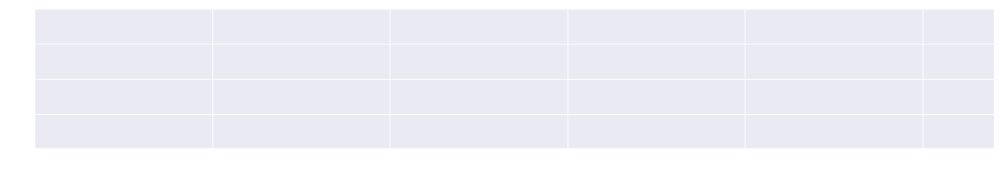

In [ ]:
from matplotlib.patches import PathPatch
import matplotlib as mpl
import seaborn as sns
#Patch out and in by timeline

# anxiety_psy[1]
name = 'jinhee'
date = 'pilot'
df = anxiety_psy[1].copy(deep=True)
# df = df[df['Scene']=='Elevator']
timemax_out = df['Time'].max()
mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "white",
                     'xtick.color' : "white",
                     'ytick.color' : "white"})
# df=df_out
df['Time'] = df['Time']/30
x, y= df['Time'], df['marker']
timemax = df['Time'].max()

plt.figure(figsize=(20,3))
plt.ylim([1,5])
plt.xlim([0,timemax])
plt.xlabel('Time(sec)',fontsize=15, weight='bold')
plt.ylabel('Anxiety(1~5)',fontsize=15, weight='bold')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

ax = sns.lineplot(data=df, x='Time', y='marker', color='ghostwhite', alpha  = 0)
ax.grid(False)
# ax.set_xticks(np.arange(0,timemax,5.0))
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
poly = ax.fill_between(x, 0, y, color='none')
img = ax.imshow(y.array.reshape(1,-1), extent=[x[0], x.max(), 0, y.max()], cmap=cmap, aspect='auto', interpolation='bilinear')
clip_poly = PathPatch(poly.get_paths()[0], transform=ax.transData)
img.set_clip_path(clip_poly)
PCM=ax.get_children()[2]
# plt.colorbar(PCM, ax=ax, pad = 0.001)
plt.colorbar(ax.get_children()[2],ax=ax, pad = 0.001)


plt.tight_layout()
savename = name
# plt.savefig(f'D:/OneDrive/HubRoom/Projects/Social Distance/Writing/새 폴더/_{savename}.png', bbox_inches='tight', dpi=300, transparent=True)
# plt.savefig(f'D:/Users/Jiyoon/OneDrive/HubRoom/Projects/Social Distance/Writing/새 폴더/_{savename}.png'
#             , bbox_inches='tight', dpi=300, transparent=True)
maxa= df['marker'].max()
mina= df['marker'].min()



In [ ]:
bubble_out, bubble_in = [], []
bubble360_out, bubble360_in = [], []
for i in range(len(names)):
    playertransform_list_out = dl.playertransform(subj_pos_out[i], subj_rot_out[i])
    playertransform_list_in = dl.playertransform(subj_pos_in[i], subj_rot_in[i])
    for idx, _df in enumerate(playertransform_list_out):
        if _df['SubjectID_1_pos'][0] == _df['SubjectID_2_pos'][0]:
            del playertransform_list_out[idx]
    for idx, _df in enumerate(playertransform_list_in):
        if _df['SubjectID_1_pos'][0] == _df['SubjectID_2_pos'][0]:
            del playertransform_list_in[idx]
    df_bubble_out = dl.personalspace(playertransform_list_out, insight = True)
    df_bubble_in = dl.personalspace(playertransform_list_in, insight = True)
    df_bubble360_out = dl.personalspace(playertransform_list_out, insight = False)
    df_bubble360_in = dl.personalspace(playertransform_list_in, insight = False)
    bubble_out.append(df_bubble_out)
    bubble_in.append(df_bubble_in)
    bubble360_out.append(df_bubble360_out)
    bubble360_in.append(df_bubble360_in)
    

c:\Users\user\code\Social-Distance\Dataloader.py:585: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bubble['social space'][j] += 1
c:\Users\user\code\Social-Distance\Dataloader.py:587: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bubble['public space'][j] += 1
c:\Users\user\code\Social-Distance\Dataloader.py:583: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_bubble['personal space'][j] += 1
c:\Users\user\code\Social-Distance\

In [ ]:
directory=f'./data/processed/Bubble_{date}'
directory360=f'./data/processed/Bubble360_{date}'

data2csv(bubble_out, names, filename='Bubble_out_',directory=directory)
data2csv(bubble_in, names, filename='Bubble_in_',directory=directory)
data2csv(bubble360_out, names, filename='Bubble360_out_',directory=directory360)
data2csv(bubble360_in, names, filename='Bubble360_in_',directory=directory360)

### Closest

In [ ]:
distv = defaultdict(dict)
for idx in range(len(names)):
    name = names[idx].split('_')[0]
    mask = 'off' if 'off' in names[idx] else 'on'
    pt_out = dl.playertransform(subj_pos_out[idx], subj_rot_out[idx])
    pt_in = dl.playertransform(subj_pos_in[idx], subj_rot_in[idx])
    w_out, w_in = dl.to_dataframe(pt_out), dl.to_dataframe(pt_in)
    distv[f'{mask}_out'][name] = w_out
    distv[f'{mask}_in'][name] = w_in

c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in scalar divide
  return dot(A, B)/(norm(A)*norm(B))
c:\Users\user\code\Social-Distance\Dataloader.py:424: RuntimeWarning: invalid value encountered in s

In [ ]:
distv_fps = defaultdict(dict)
for identifier, participant in distv.items():
        for name, w in participant.items():
            df = pd.DataFrame(columns=['Time','distance', 'visual_degree', 'agent'])
            for _df in w:
                if math.isnan(_df['visual_degree'][0]):
                    continue
                _df = _df.rename({'subject_ID': 'agent'}, axis=1)
                _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
                _df = _df.drop_duplicates(subset = ['Time'] , keep='first')
                _df = _df.set_index('Time')
                newindex = range(0,_df.index[-1]+1)
                _df = _df.reindex(newindex).fillna(method = 'ffill')
                _df.reset_index(inplace=True)
                _df = _df.rename({'index': 'Time'}, axis=1)
                df = pd.concat([df,_df], axis=0)
            df = df.reset_index(drop=True)
            distv_fps[identifier][name] = df




In [ ]:
save2pkl(distv_fps, f'./data/processed/distance_{date}.pkl')


## If all raw files are processed and saved as file, Just Start Here

In [ ]:
# datelist = os.listdir('data/raw/.')
datelist = os.listdir('data/raw/.')

distances = {}
for date in datelist:
    distances[date] = openpkl(f'./data/processed/distance_{date}.pkl')

save2pkl(distances, f'./data/processed/distances_all.pkl')

### To FPS

In [ ]:
# datelist = os.listdir('data/raw/.')
datelist = os.listdir('data/raw/.')
#Bucket for data
coughings, anxieties, bubbles, bubble360s, transforms= {}, {}, {}, {}, {}
#Bucket for data to be processed as time -> fps
coughings_fps,anxieties_fps, bubbles_fps, bubble360s_fps, transforms_fps, length = {}, {}, {}, {}, {}, {}
# allocate files to proper bucket and deep copy them for the fps processing
intentions, cintentions = {}, {}
for item in datelist:
    date = item
    filenames_c = sorted(glob(f"data/cough/coughing_count_manual_{date}.xlsx"))
    filenames_i = sorted(glob(f"data/processed/Intentions_{date}/*.csv"))
    filenames_ic = sorted(glob(f"data/processed/Coughintentions_{date}/*.csv"))
    filenames_a = sorted(glob(f"data/processed/Anxiety_{date}/*.csv"))
    filenames_b = sorted(glob(f"data/processed/Bubble_{date}/*.csv"))
    filenames_b_360 = sorted(glob(f"data/processed/Bubble360_{date}/*.csv"))
    # filenames_t = f"data/processed/transform_{date}.pkl"
    filenames_t = f"data/processed/transform_{date}.pkl"
    

    # filenames = ['data/cough/' + n for n in os.listdir('data/cough')] #if directory issue occurs, use this code instead. 
    # Get data organized, return dict containing start-end coughing timepoint df and metadata 
    # of total time and goal reaching time
    coughings[date] = coughxlsx2df(filenames_c) 
    anxieties[date] = processed2df(filenames_a)
    bubbles[date] = processed2df(filenames_b)
    bubble360s[date] = processed2df(filenames_b_360)
    intentions[date] = processed2df(filenames_i)
    cintentions[date] = processed2df(filenames_ic)
    transforms[date] = openpkl(filenames_t)
    
    
    
    #To process fps indexed df. we need to keep coughing because we need start-end df too
    coughings_fps[date] = copy.deepcopy(coughings[date])
    anxieties_fps[date] = copy.deepcopy(anxieties[date]) 
    bubbles_fps[date] = copy.deepcopy(bubbles[date]) 
    bubble360s_fps[date] = copy.deepcopy(bubble360s[date])
    transforms_fps[date] = copy.deepcopy(transforms[date])
    

KeyboardInterrupt: 

In [ ]:
pd.isnull(coughings['2204']['on_out']['jyh0104'][0]['Start_timepoint'][0])
# coughings['2204']['on_in']['jyh0104'][0]['Start_timepoint'][0]

False

### Coughing to fps

In [ ]:
# create columns by coughing type
type2column = {
    "f": "Cough_Full",
    "s": "Cough_SoundOnly",
    "a": "Cough_ActionOnly"
}
for item in datelist: #by period of experiment
    date = item
    coughing = coughings[date]

    for identifier, participant in coughing.items():
        for name, (_df, m) in participant.items():
            if pd.isnull(_df['Start_timepoint'][0]): #if coughing is empty
                print(f'empty df is detected: {date}')
                frame_df = pd.DataFrame(columns = list(type2column.values()))
                

            else:
                            
                # to fps
                _df.loc[:, ["Start_frame"]] = _df.Start_timepoint.apply(time2frame)
                _df.loc[:, ["End_frame"]] = _df.End_timepoint.apply(time2frame)
                
                # Create new df with fps based index
                frame_df = pd.DataFrame({
                    v: [0] * (m["Total_video_length"] + 1) for v in type2column.values() #+1 because index start from 0
                })
                for row in _df.values:
                    _type, _, _, _start, _end = row
                    frame_df.loc[_start:_end, type2column[_type]] += 1
                
                
            coughings_fps[date][identifier][name] = frame_df 

C:\Users\user\AppData\Local\Temp\ipykernel_3740\3858926400.py:21: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  _df.loc[:, ["Start_frame"]] = _df.Start_timepoint.apply(time2frame)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\3858926400.py:22: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  _df.loc[:, ["End_frame"]] = _df.End_timepoint.apply(time2frame)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\3858926400.py:21: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new a

3866

### Anxiety and Bubble FPS

In [ ]:
bubbles_dict = {}
bubbles_dict_360 = {}

for item in datelist:
    date = item
    anxiety = anxieties[date]
    bubble = bubbles[date]
    bubble_360 = bubble360s[date]
    #Anxiety to fps
    for identifier, participant in anxiety.items():
        for name, _df in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            _df.reset_index(inplace=True)
            _df = _df[_df.columns.drop(list(_df.filter(regex='Subject')))]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
            _df = _df.drop_duplicates(subset = ['Time'] , keep='first')
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1]
            anxieties_fps[date][identifier][name] = _df 
    #Bubble to fps
    for identifier, participant in bubble.items():
        for name, _df in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            _df = _df[_df.columns.drop(list(_df.filter(regex='Unnamed')))]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1]
            bubbles_fps[date][identifier][name] = _df 
    #This is no visual field limited data(360degree)
    for identifier, participant in bubble_360.items():
        for name, _df in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            _df = _df[_df.columns.drop(list(_df.filter(regex='Unnamed')))]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False) 
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1]
            bubble360s_fps[date][identifier][name] = _df 
      
#To start-end frame formet with distance(personal, social..) as a label
    bubble_dict = defaultdict(dict)
    bubble_dict_360 = defaultdict(dict)

    for identifier, participant in bubbles_fps[date].items():
        for name, _df in participant.items():
            bubble_dict[identifier][name] = bubbles2e(_df)
            bubble_dict[identifier][name] = bubble_dict[identifier][name].astype({"Start_Frame" : "int", "End_Frame" : "int"})
    bubbles_dict[date] = bubble_dict
    
    for identifier, participant in bubble360s_fps[date].items():
        for name, _df in participant.items():
            bubble_dict_360[identifier][name] = bubbles2e(_df)
            bubble_dict_360[identifier][name] = bubble_dict_360[identifier][name].astype({"Start_Frame" : "int", "End_Frame" : "int"})
    bubbles_dict_360[date] = bubble_dict_360

C:\Users\user\AppData\Local\Temp\ipykernel_3740\2800899843.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['Time'] = _df['Time'].apply(time2frame, textformet=False)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\2800899843.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['Time'] = _df['Time'].apply(time2frame, textformet=False)
C:\Users\user\AppData\Local\Temp\ipykernel_3740\2800899843.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

### Animating Pathway -transforms to fps and add anxiety

In [ ]:
for item in datelist:
    date = item    
    transform = transforms[date]
    transforms_fps[date] = copy.deepcopy(transforms[date])
    print(date)
    for identifier, participant in transform.items():
        for name, lst in participant.items():
            totallen = coughings[date][identifier][name][1]['Total_video_length']
            anxiety = anxieties_fps[date][identifier][name]
            _df = lst[-1]
            _df['Time'] = _df['Time'].apply(time2frame, textformet=False)
            _df = _df.set_index('Time')
            newindex = range(0,_df.index[-1]+1)
            _df = _df.reindex(newindex).fillna(method = 'ffill')
            _df = _df[:totallen+1] 
            _df = pd.merge(_df, anxiety, on='Time', how='left')
            transforms_fps[date][identifier][name] = _df
            

2108-2202
2204
2205
2209
2302


In [ ]:
closest_m = pd.DataFrame()
closests = {}
for date, _dict in distances.items():
    temp = defaultdict(dict)
    for identifier, participant in _dict.items():
        spatial = 'out' if 'out' in identifier else 'in'
        mask = 'off' if 'off' in identifier else 'on'
        for name, _df in participant.items():
            anx = anxieties_fps[date][identifier][name]
            closest = distances[date][identifier][name].groupby(by='Time').min()
            closest = pd.concat([closest,anx], axis=1).dropna()
            closest = closest.rename({'agent':'name'})
            closest['name'], closest_m['name'] = name, name
            closest_m['distance'] = closest['distance'].mean()
            closest_m['Anxiety'] = closest['AnxietyLv'].mean()
            closest_m['mask'], closest_m['spatial'] = mask, spatial
            closest_m['date'] = date
            temp[identifier][name] = closest
    closests[date] = temp

save2pkl(closests, f'./data/processed/closests_all.pkl')

NameError: name 'distances' is not defined

In [ ]:
save2pkl(transforms, './data/processed/transforms_all_overps.pkl')
save2pkl(transforms_fps, './data/processed/transforms_player_overps.pkl')

In [ ]:
save2pkl(intentions, f'./data/processed/intentions_all.pkl')
save2pkl(cintentions, f'./data/processed/coughingintentions_all.pkl')


In [ ]:
transforms[date][identifier][name][0]

,Time,X_2_pos,Z_2_pos,Y_2_rot,case,distance,name,zone
0,18.2110,38.18064,-91.01686,85.78771,agent,3.018336,ysu9903,social
1,18.3223,38.14015,-91.04375,85.78771,agent,3.034094,ysu9903,social
2,18.4331,38.14015,-91.04375,85.78771,agent,3.037018,ysu9903,social
3,18.7654,38.14015,-91.04375,85.78771,agent,3.047070,ysu9903,social
4,19.0773,38.14015,-91.04375,85.78771,agent,3.062775,ysu9903,social
...,...,...,...,...,...,...,...,...
77,27.7847,38.74004,-90.82249,85.79963,agent,6.808734,ysu9903,public
78,27.8960,38.74004,-90.82249,85.79963,agent,6.972616,ysu9903,public
79,28.0067,38.74004,-90.82249,85.79963,agent,7.135111,ysu9903,public
80,28.1176,38.74004,-90.82249,85.79963,agent,7.297479,ysu9903,public


In [ ]:
date

'2302'

In [ ]:
integrates = defaultdict(dict)
integrates360 = defaultdict(dict)

for item in datelist:
    date = item
    integrated = defaultdict(dict)
    coughing_fps = coughings_fps[date]
    anxiety_fps = anxieties_fps[date]
    bubble_fps = bubbles_fps[date]
    bubble_fps_360 = bubble360s_fps[date]
    for identifier, participant in coughing_fps.items():
        for name, _df in participant.items():
            coughing_ = coughing_fps[identifier][name]
            anxiety_ = anxiety_fps[identifier][name]
            bubble_ = bubble_fps[identifier][name]
            
            _df = pd.concat([anxiety_,coughing_,bubble_], axis = 1).fillna(method = 'ffill')
            
            integrated[identifier][name] = _df
    integrates[date] = integrated

    integrated360 = defaultdict(dict)
    for identifier, participant in coughing_fps.items():
        for name, _df in participant.items():
            coughing_ = coughing_fps[identifier][name]
            anxiety_ = anxiety_fps[identifier][name]
            bubble_ = bubble_fps_360[identifier][name]
            
            _df = pd.concat([anxiety_,coughing_,bubble_], axis = 1).fillna(method = 'ffill')
            
            integrated360[identifier][name] = _df
    integrates360[date] = integrated360

### Goal

In [ ]:
goal_df = pd.DataFrame()
for identifier, participant in coughing.items():
    goal = []
    goal_val = []
    # Get list of dataframe in identifier

    #Get mask and place case from identifier
    spatial = 'out' if 'out' in identifier else 'in'
    mask = 'off' if 'off' in identifier else 'on'
    
    for name, _df in participant.items():
        goal_time = _df[1]['Goal_On sight']
        before = anxiety_fps[identifier][name][:goal_time]['AnxietyLv'].mean()
        after = anxiety_fps[identifier][name][goal_time:]['AnxietyLv'].mean()
        bf = {'Anxiety': before,'mask': mask,'spatial': spatial,'Case': 'before', 'name': name}
        af = {'Anxiety': after,'mask': mask,'spatial': spatial,'Case': 'after', 'name': name}
        total = pd.concat([pd.DataFrame(data = bf, index = [0]),pd.DataFrame(data = af, index = [0])], axis=0).reset_index(drop=True)
        goal_df = pd.concat([goal_df,total], axis=0).reset_index(drop=True)
        
        

    #Get Cuts of cases by cut functions
    # goal, goal_val = cut2single(coughing_temp,anxiety_temp,goal,goal_val,'Goal_On sight',interval=30)
    # # Create Goal Dataframe for analysis and plotting
    # for idx in range(len(goal)):
    #     name = goal[idx]['Subject']
    #     before = goal_val[idx][0]
    #     after = goal_val[idx][0]
    #     print(before, after)
    # # before = [i[0] for i in goal_val]
    # # after = [i[1] for i in goal_val]
    # # subject = goal['Subject']
    #     bf = {'Anxiety': before,'mask': mask,'spatial': spatial,'Case': 'before', 'name': name}
    #     af = {'Anxiety': after,'mask': mask,'spatial': spatial,'Case': 'after', 'name': name}
    #     total = pd.concat([pd.DataFrame(data = bf, index = [idx]),pd.DataFrame(data = af, index = [idx])], axis=0).reset_index(drop=True)
    #     goal_df = pd.concat([goal_df,total], axis=0).reset_index(drop=True)
        

In [ ]:
save2pkl(coughings_fps, './data/processed/coughings_fps_all.pkl')
save2pkl(anxieties_fps, './data/processed/anxieties_fps_all.pkl')
save2pkl(bubbles_fps, './data/processed/bubbles_fps_all.pkl')
save2pkl(bubble360s_fps, './data/processed/bubble360s_fps_all.pkl')
save2pkl(bubbles_dict, './data/processed/bubbles_dict_all.pkl')
save2pkl(bubbles_dict_360, './data/processed/bubbles_dict_360_all.pkl')
save2pkl(integrates, './data/processed/integrates_all.pkl')
save2pkl(integrates360, './data/processed/integrates360_all.pkl')
save2pkl(coughings, './data/processed/coughings_all.pkl')




### Transform

In [ ]:
transforms = openpkl('./data/processed/transforms_all_overps.pkl')
transforms_player = openpkl('./data/processed/transforms_player_overps.pkl')

In [ ]:
_transformp = pd.DataFrame()
_transforma = pd.DataFrame()
for date, dct in transforms.items():
    for identifier, participant in dct.items():
        for name, lst in participant.items():
            current_p = transforms_player[date][identifier][name].reset_index().copy(deep=True)
            current_a = pd.concat(transforms[date][identifier][name]).reset_index(drop=True)
            current_a = current_a[current_a['case']=='agent']
            
            current_p = current_p.drop(columns=['distance', 'Y_2_rot', 'zone'])
            current_a = current_a.drop(columns=['Y_2_rot'])
            spatial = identifier.split('_')[1]
            mask = identifier.split('_')[0]
            current_p['spatial'], current_p['mask'], current_p['date'] = spatial, mask, date
            current_a['spatial'], current_a['mask'], current_a['date'] = spatial, mask, date
            
            _transformp = pd.concat([_transformp, current_p],axis=0)
            _transforma = pd.concat([_transforma, current_a],axis=0)
            
_transformp = _transformp.reset_index(drop=True)
_transforma = _transforma.reset_index(drop=True)
lst = ['out', 'in']
t_range = {}
gap = 4 #8
for spatial in lst:
    df_all = _transformp[_transformp['spatial']==spatial]
    xmax, xmin = df_all['X_2_pos'].max(), df_all['X_2_pos'].min()
    zmax, zmin = df_all['Z_2_pos'].max(), df_all['Z_2_pos'].min()
    xrange, zrange = (xmax-xmin), (zmax-zmin)
    xintlist, zintlist = np.arange(xmin-1, xmax+0.1, gap, dtype=float), np.arange(zmin-1, zmax+0.1, gap, dtype=float) #To make the figure in same way, 
    xintlist[-1], zintlist[-1] = xmax+1, zmax+1
    t_range[spatial]=[xintlist, zintlist]
    xint, zint = (xrange/10), (zrange/10)
    print(f'X range:{xrange}, Z range:{zrange}')
    print(f'X interval:{xint}, Z interval:{zint}')
    print(max(xintlist),max(zintlist))
    print(min(xintlist),min(zintlist))
    print(len(xintlist),len(zintlist))


X range:81.019586, Z range:79.2672
X interval:8.1019586, Z interval:7.92672
72.07674 -14.83648
-10.942846 -96.10368
21 21
X range:88.35838000000001, Z range:53.55270000000001
X interval:8.835838, Z interval:5.355270000000001
49.5313 -39.40277
-40.82708 -94.95547
23 14


In [ ]:
transforms_p_ = pd.DataFrame()
transforms_p = pd.DataFrame()

threshold = 6
for date, dct in transforms.items():
    for identifier, participant in dct.items():
        for name, lst in participant.items():
            spatial = identifier.split('_')[1]
            df = transforms_player[date][identifier][name].copy(deep=True)
            df['district']= ''
            xintlist = t_range[spatial][0]
            zintlist = t_range[spatial][1]
            for intx in range(len(xintlist)-1):
                for intz in range(len(zintlist)-1):
                    bx, ax = xintlist[intx], xintlist[intx+1]
                    bz, az = zintlist[intz], zintlist[intz+1]
                    df.loc[(df['X_2_pos']>=bx)&(df['X_2_pos']<ax)&(df['Z_2_pos']>=bz)&(df['Z_2_pos']<az),'district'] = f'{intx}_{intz}'
            anx_df = df[['AnxietyLv', 'district']].reset_index(drop=True).groupby(['district']).mean().reset_index()
            anx_df['name'], anx_df['spatial'] = name, spatial
            transforms_p_ = pd.concat([transforms_p_, anx_df])
transforms_p_ = transforms_p_.reset_index(drop=True)  
df_c = transforms_p_.groupby(['district','spatial']).count().reset_index() 
transforms_p_ = transforms_p_[~transforms_p_['district'].isin(list(df_c[df_c['name']<threshold]['district']))].reset_index(drop=True)  
transforms_p = transforms_p_.groupby(['district','spatial']).mean().reset_index() 


In [ ]:
lst = transforms[date][identifier][name]
transforms_a_ = pd.DataFrame()
transforms_a = pd.DataFrame()

threshold_d = 7.6
df_ta = pd.DataFrame()
for date, dct in transforms.items():
    for identifier, participant in dct.items():
        for name, lst in participant.items():
            spatial = identifier.split('_')[1]
            xintlist = t_range[spatial][0]
            zintlist = t_range[spatial][1]
            for idx in range(len(lst)):
                df = transforms[date][identifier][name][idx].copy(deep=True)
                if df['case'][0] !='participant':
                    df['district']= ''
                    for intx in range(len(xintlist)-1):
                        for intz in range(len(zintlist)-1):
                            bx, ax = xintlist[intx], xintlist[intx+1]
                            bz, az = zintlist[intz], zintlist[intz+1]
                            df.loc[(df['X_2_pos']>=bx)&(df['X_2_pos']<ax)&(df['Z_2_pos']>=bz)&(df['Z_2_pos']<az),'district'] = f'{intx}_{intz}'
                    df = df[df['distance']<threshold_d].reset_index(drop=True)
                    _df = df[['Time','distance', 'district']]
                    _df['index'] = idx
                    _df['Time'] = _df['Time'].apply(math.floor)
                    _df = _df.groupby(['Time','district','index']).mean().reset_index()
                    _df['name'], _df['spatial'] = name, spatial
                    df_ta = pd.concat([df_ta,_df], axis=0).reset_index(drop=True)
            df_ta = df_ta.sort_values(by=['Time']).reset_index(drop=True)
            df_all = df_ta.groupby(['district','Time','index','spatial','name']).count().sort_values(by='Time').reset_index()
            df_all = df_all.groupby(['district','Time','spatial','name']).count().sort_values(by='Time').reset_index()
            df_d = df_ta.groupby(['district','Time','index','spatial','name']).mean().sort_values(by='Time').reset_index()
            df_d = df_d.groupby(['district','Time','spatial','name']).mean().sort_values(by='Time').reset_index()
            df_all['distance'] = df_d['distance']
            df_all =  df_all.rename(columns={'index': 'count'})
            transforms_a_ = pd.concat([transforms_a_, df_all])

transforms_a_ = transforms_a_.reset_index(drop=True)  
transforms_a_ = transforms_a_.reset_index(drop=True)  
cnt = transforms_a_.groupby(['district','Time','spatial']).count().reset_index()
dst = transforms_a_.groupby(['district','Time','spatial']).mean().reset_index()
cnt['distance'], cnt['count'] = dst['distance'], dst['count']
cnt = cnt[~cnt['district'].isin(list(cnt[cnt['name']<threshold]['district']))].reset_index(drop=True) 
transforms_a = cnt.groupby(['district','spatial']).mean().reset_index()


C:\Users\Jiyoon\AppData\Local\Temp/ipykernel_16972/2444021299.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['index'] = idx
C:\Users\Jiyoon\AppData\Local\Temp/ipykernel_16972/2444021299.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _df['Time'] = _df['Time'].apply(math.floor)


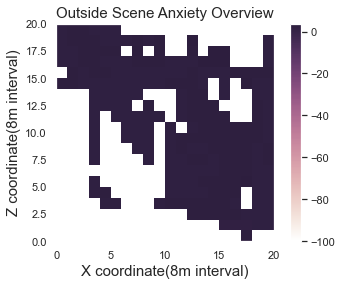

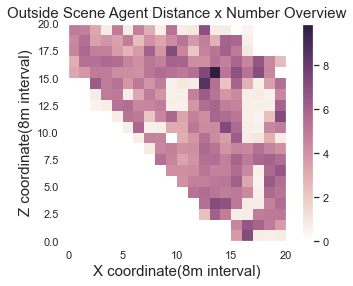

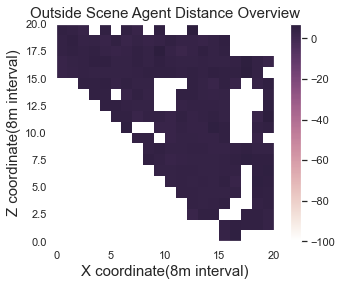

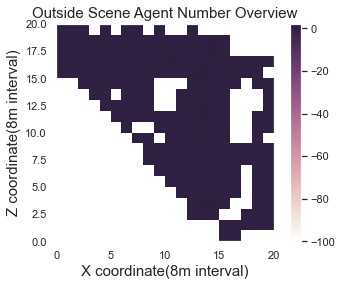

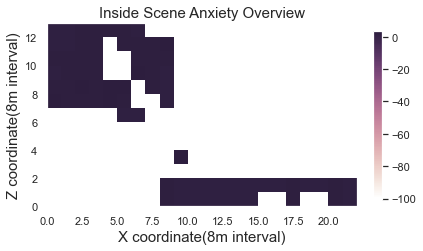

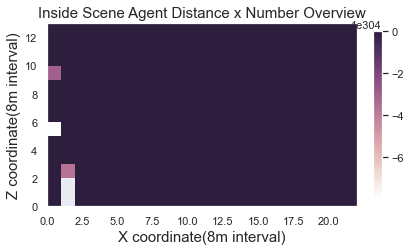

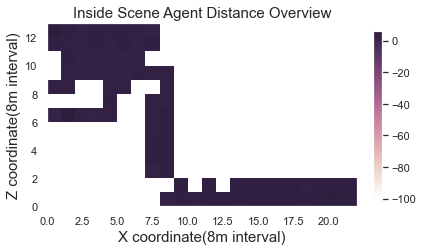

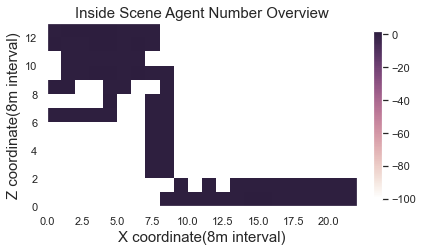

In [ ]:
lst = ['out', 'in']
gridanx = []
gridagentd = []
gridagentn = []
gridweighted = []

for spatial in lst:
    xintlist = t_range[spatial][0]
    zintlist = t_range[spatial][1]
    df = transforms_p[transforms_p['spatial']==spatial].reset_index(drop=True)
    df_a = transforms_a[transforms_a['spatial']==spatial].reset_index(drop=True)
    maxd = max(df_a['distance'])
    mind = min(df_a['distance'])
    df_a['distance'] = (df_a['distance']-(maxd+mind)).abs()
    #Fromzero
    # anxarr = np.zeros((len(xintlist)-1,len(zintlist)-1))
    # distarr = np.zeros((len(xintlist)-1,len(zintlist)-1))
    # numarr = np.zeros((len(xintlist)-1,len(zintlist)-1))
    
    anxarr = np.empty((len(xintlist)-1,len(zintlist)-1))
    distarr = np.empty((len(xintlist)-1,len(zintlist)-1))
    numarr = np.empty((len(xintlist)-1,len(zintlist)-1))
    warr = np.empty((len(xintlist)-1,len(zintlist)-1))
    
    # #Scaled
    # anxarr.fill(min(df['AnxietyLv']))
    # distarr.fill(min(df_a['distance']))
    # numarr.fill(min(df_a['count']))
    # warr.fill(min(df_a['count'])*min(df_a['distance']))
    
    
    # Empty check
    checknum =-1
    anxarr.fill(checknum)
    distarr.fill(checknum)
    numarr.fill(checknum)    

    
    for idx in range(len(df)):
        x = int(df['district'][idx].split('_')[0])
        z = int(df['district'][idx].split('_')[1]) 
        anxiety = df['AnxietyLv'][idx]
        anxarr[x,z] = anxiety
    for idx in range(len(df_a)):
        x = int(df_a['district'][idx].split('_')[0])
        z = int(df_a['district'][idx].split('_')[1]) 
        distance = df_a['distance'][idx]
        count = df_a['count'][idx]
        weighted = distance*count
        distarr[x,z] = distance
        numarr[x,z] = count
        warr[x,z] = weighted
        
        

    gridanx.append(anxarr)
    gridagentd.append(distarr)
    gridagentn.append(numarr)
    gridweighted.append(warr)
lst=['Outside','Inside']

arrs = [gridanx, gridweighted, gridagentd, gridagentn]
arrn = ['Anxiety', 'Agent Distance x Number','Agent Distance', 'Agent Number']
condition = 'emptycheck_without limitation_20'
for sidx in range(len(lst)):
    for idx in range(len(arrs)):
        item = arrs[idx]
        arrname = arrn[idx]
        spatial = lst[sidx]
        fig, ax = plt.subplots(1)
        name = f'{spatial} Scene {arrname} Overview'
        cmap = sns.cubehelix_palette(light=1, as_cmap=True)
        ax.set_title(name, fontsize=15)
        ax.set_xlabel('X coordinate(8m interval)', fontsize=15)
        ax.set_ylabel('Z coordinate(8m interval)', fontsize=15)
        savename = name + condition
        p = ax.pcolormesh(np.transpose(item[sidx]), alpha=1, cmap=cmap)
        plt.gca().set_aspect("equal")
        if spatial =='Inside':
            fig.colorbar(p, fraction=0.025)
        else:
            fig.colorbar(p)
        
        plt.savefig(f'graphs/overleaf/{savename}.png', bbox_inches='tight')
        plt.show()


    
    



In [ ]:
save2pkl(transforms_p, './data/processed/transforms_p_20_withoutlim.pkl')
save2pkl(transforms_a, './data/processed/transforms_a_20_withoutlim.pkl')